In [275]:
import gc

In [276]:
# # install packages if needed
!pip install --upgrade pip
!pip install tensorflow dalex optuna

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [277]:
# # run this cell if you leverage the colab envrionment
# # Connect to the Google Drive
from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [278]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import time
from tqdm.auto import tqdm

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

warnings.filterwarnings("ignore")

In [279]:
project_path = '/content/gdrive/MyDrive/111-2 機器學習與資料分析在會計領域之應用/111-2 月營收金額'

In [280]:
org_data = pd.read_excel(os.path.join(project_path, '201301-202212_listed_nonfin.xlsx'), index_col=0)
# org_data = pd.read_excel('201301-202212_listed_nonfin.xlsx', index_col=0)
org_data.columns = pd.to_datetime(org_data.columns).to_period('M')
org_data

,2013-01,2013-02,2013-03,2013-04,2013-05,2013-06,2013-07,2013-08,2013-09,2013-10,...,2022-03,2022-04,2022-05,2022-06,2022-07,2022-08,2022-09,2022-10,2022-11,2022-12
公司,,,,,,,,,,,,,,,,,,,,,
1101 台泥,9134465,5540346,9457971,9919269,9543782,9517630,9875888,9835143,10060975,10654077,...,9971650,8319342,7733787,9145989,10102468,10689860,10404901,11368096,9674576,12584154
1102 亞泥,6018213,2552357,5428755,5930748,6239676,5952754,5942364,5786107,5879394,6478670,...,8160414,8710220,8000427,7776413,7864622,7069221,6994078,7601097,8306062,8340507
1103 嘉泥,288455,166638,286007,365292,382601,302995,294781,336088,314563,429783,...,220463,168089,163521,183177,178825,182371,205264,209429,221763,228644
1104 環泥,486481,299860,461732,394631,406677,415968,453397,393203,448691,521445,...,591593,638493,537082,573028,580420,605512,597159,634981,631827,725055
1108 幸福,481802,276936,444917,362054,381384,368109,439572,379115,387362,450770,...,345612,335518,332258,334113,326691,390053,346635,401202,383773,418326
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9951 皇田,201785,167967,240746,243935,238296,193880,198427,256724,228796,250756,...,374229,302262,323433,371791,337581,468608,464373,432835,500111,506796
9955 佳龍,394489,383183,428478,564053,336622,295391,434605,306534,266617,363766,...,96200,101850,95096,80726,85625,81881,79179,80630,91270,84115
9958 世紀鋼,198944,166364,351222,280864,289332,426371,213281,302589,401695,255738,...,626104,401960,673479,665459,651699,757968,903198,911834,944060,1082675


In [281]:
print("Data shape:", org_data.shape)
print("Data size:", org_data.size)

Data shape: (1240, 120)
Data size: 148800


In [282]:
# 往前推算月份
def back_month(yr: int, mon: int, back: int):
    '''
    往前推算月份。

    Parameters
    ----------
    yr: 第t期的年, mon: 第t期的月, back: 往前推算幾個月
    '''

    # 若當下月份(mon)減除往前期數(b)大於0，即還在同一年內
    if mon - back > 0:                         
        return str(yr) + '-' + str(mon - back)      # 直接回傳當下年份(yr)，以及當下月份(mon)減除往前期數(back)，所組成的字串
    # 不屬於同一年
    else:                               
        return back_month(yr - 1, mon, back - 12)   # 手動調減一年，並將往前期數(back)減少12個月

In [283]:
# 取得 t-back_most ~ t-1 期的 X 資料
def X_months(data: pd.DataFrame, y_yr: int, y_mon: int, back_most: int):
    '''
    取得 t-back_most ~ t-1 期的 X 資料。

    Parameters
    ----------
    data: 資料集; y_yr: 第t期的年, y_mon: 第t期的月, back_most: X的最早月份是第t期的往前多少月份
    '''

    months = []
    for b in range(back_most, 0, -1):               # 從 back_most 到 1
        months.append(back_month(y_yr, y_mon, b))   # 根據每個往前月份數(b)推算對應年月，儲存進 months 之中
    
    # 回傳 data 中的這些月份
    return data[months]

In [284]:
from datetime import datetime

# 取得起始年月到終止年月的每個年月
def month_range(y_start_yr: int, y_start_mon: int, y_end_yr: int, y_end_mon: int):
    '''
    取得起始年月到終止年月的每個年月。

    Parameters
    ----------
    y_start_yr: 起始年, y_start_mon: 起始月, y_end_yr: 終止年, y_end_mon: 終止月
    '''

    start_ym = str(y_start_yr) + '-' + str(y_start_mon)
    
    # pd.date_range 中的 end 為終止月的下一個月，因此須將終止年月加 1 個月
    if y_end_mon < 12:
        end_ym = str(y_end_yr) + '-' + str(y_end_mon + 1)   # 終止月為1-11月時，直接在月份+1
    else: 
        end_ym = str(y_end_yr + 1) + '-' + '1'              # 終止月為12月時，end 設為下一年的1月
    
    # 生成從起始年月到終止年月的每個年月
    month_list = pd.date_range(start=start_ym, end=end_ym, freq='M').to_period('M').strftime('%Y-%m').to_numpy()

    return month_list

In [285]:
# 對 X 做標準化（和 sklearn 的 StandardScaler 公式相同）
def standardize_X(data: pd.DataFrame):
    '''
    對 X 做標準化。

    Parameters 
    ----------
    data: X

    Returns
    ----------
    mean, std, std_data
    '''
    mean = data.mean(axis=1)
    std = data.std(axis=1)
    std_data = data.apply(lambda row: (row-mean[row.name])/std[row.name], axis=1)
    return mean, std, std_data

# 以 X 的平均數和標準差對 y 做標準化
def standardize_y(mean: pd.Series, std: pd.Series, data: pd.Series):
    '''
    以 X 的平均數和標準差對 y 做標準化。

    Parameters
    ----------
    mean: X 的平均數, std: X 的標準差, data: y
    
    Returns
    ----------
    std_data
    '''
    std_data = []
    for i in range(len(data)):
        std_data.append((data[i]-mean[i])/std[i])
    return std_data

# 將標準化的 y 轉回正常值
def standardized_y_back(mean: pd.Series, std: pd.Series, std_data: np.array):
    '''
    將標準化的 y 轉回原始值。

    Parameters 
    ----------
    mean: X 的平均數, std: X 的標準差, data: 標準化的 y

    Returns
    ----------
    data
    '''
    data = []
    for i in range(len(std_data)):
        data.append(std_data[i] * std[i] + mean[i])
    return data

In [286]:
# 取得訓練和測試資料集
def get_train_test(data: pd.DataFrame, y_test_yr: int, y_test_mon: int, back_most: int, y_back: int):
    '''
    取得訓練和測試資料集。

    Parameters
    ----------
    data: 資料集, y_test_yr: 要預測的年, y_test_mon: 要預測的月, 
    back_most: X的最早月份是第t期的往前多少月份, 
    y_back: 訓練資料集的y要比測試資料集的y往前多少月份

    Returns 
    ----------
    X_train, y_train, X_test, y_test
    '''

    # 測試資料
    y_test = data[f'{y_test_yr}-{y_test_mon}']
    X_test = X_months(data, y_test_yr, y_test_mon, back_most)
    # 訓練資料
    y_train_ym = back_month(y_test_yr, y_test_mon, y_back)
    y_train = data[y_train_ym]
    X_train = X_months(data, int(y_train_ym.split("-")[0]), int(y_train_ym.split("-")[1]), back_most)
    # 更改X的變數名稱為 t-? 期
    X_test.columns = ["t-"+str(t) for t in range(back_most, 0, -1)]                                     
    X_train.columns = ["t-"+str(t) for t in range(back_most, 0, -1)]     

    return X_train, y_train, X_test, y_test

In [287]:
# module for deep learning 
import tensorflow as tf
tf.random.set_seed(2023) # fix random seed
# keras is the submodule of tensorflow, which is beginner-friendly for particitioner
from tensorflow import keras
from keras.backend import clear_session
# dalex is for explaining the variable importance of deep learning model
import dalex as dx
# optuna is a module for tuning hyperparametes
# import optuna

In [288]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [289]:
def make_dnn_model(input_shape):
    '''
    input_shape: int, should equal to feature period
    '''
    # input layer
    input_layer = keras.layers.Input((input_shape,))
    
    # model first layer
    x = keras.layers.Dense(input_shape)(input_layer)
    # equal to:
    # dense_layer = keras.layers.Dense(input_shape)
    # x = dense_layer(x)
    x = keras.layers.ReLU()(x)
    
    # model second layer
    x = keras.layers.Dense(input_shape)(x)
    dense_out = keras.layers.ReLU()(x)
    
    # model output layer
    output_layer = keras.layers.Dense(1)(dense_out)
        
    # tell python what are the model's input and output
    return keras.models.Model(inputs=input_layer, outputs=output_layer)

In [290]:
NUM_FEATURES = 48 
EARLY_STOPPING_STEPS = 30
BATCH_SIZE = 1024
EPOCHS = 2000
LEARNING_RATE = 0.005

def evaluate_keras_model(
    name, 
    model_fn, 
    learning_rate,
    X_train,
    y_train,
    X_valid,
    y_valid
):
    
    # X_train, y_train = X_train.to_numpy(), np.array(y_train)
    # X_valid, y_valid = X_valid.to_numpy(), np.array(y_valid)
    # path for saving logs in order to work with tensorboard, use timestamp to distinguish different trial
    logdir = os.path.join("logs", name, datetime.now().strftime("%Y%m%d-%H%M%S"))
    callbacks = [
        keras.callbacks.ModelCheckpoint(
            f"{name}.h5", save_best_only=True, monitor="val_loss"
        ),
        keras.callbacks.EarlyStopping(
            monitor="val_loss", 
            patience=EARLY_STOPPING_STEPS, 
            verbose=0
        ),
        keras.callbacks.TensorBoard(logdir, histogram_freq=1)
    ]
    optimizer = keras.optimizers.legacy.Adam(learning_rate=learning_rate)
    losses = [keras.losses.MeanSquaredError()]
    metrics = [keras.metrics.MeanAbsoluteError()]
    
    model = model_fn(NUM_FEATURES)
    model.compile(
        optimizer=optimizer,
        loss=losses,
        metrics=metrics,
    )
    
    history = model.fit(
        X_train,
        y_train,
        batch_size=BATCH_SIZE,
        epochs=EPOCHS,
        callbacks=callbacks,
        # determine validation set
        validation_data=(
            X_valid, 
            y_valid
        ),
        # show information in the training process
        verbose=0,
        # speed up settings
        workers=-1,
        use_multiprocessing=True
    )
    
    # reload the best model saved by ModelCheckpoint callback
    model = keras.models.load_model(f"{name}.h5")
        
    return history, model

In [291]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [292]:
def plot_loss(history):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.xlabel('Epoch')
    plt.ylabel('Error')
    plt.legend()
    plt.grid(True)

In [293]:
def show_dalex(model, X_train, y_train):
    explainer = dx.Explainer(
        model, 
        X_train,
        y_train,
        label='revenue',
        verbose=False # disable progress bar
    )
    feature_importance = explainer.model_parts(N=500)
    return feature_importance.result.drop('label', axis=1).set_index('variable')

In [294]:
def make_cnn_model(input_shape):
    '''
    input_shape: int, should equal to feature period
    ref: https://keras.io/examples/timeseries/timeseries_classification_from_scratch/
    paper: https://arxiv.org/pdf/1611.06455.pdf
    '''
    input_layer = keras.layers.Input((input_shape, 1))
    # not panel data, so the input is only 1-dimension every timestamp
    
    conv1 = keras.layers.Conv1D(filters=64, kernel_size=3, padding="same")(input_layer)
    conv1 = keras.layers.BatchNormalization()(conv1)
    conv1 = keras.layers.ReLU()(conv1)

    conv2 = keras.layers.Conv1D(filters=64, kernel_size=3, padding="same")(conv1)
    conv2 = keras.layers.BatchNormalization()(conv2)
    conv2 = keras.layers.ReLU()(conv2)

    conv3 = keras.layers.Conv1D(filters=64, kernel_size=3, padding="same")(conv2)
    conv3 = keras.layers.BatchNormalization()(conv3)
    conv3 = keras.layers.ReLU()(conv3)
    
    # pooling: reduce the output
    gap = keras.layers.GlobalAveragePooling1D()(conv3)
    
    output_layer = keras.layers.Dense(1)(gap)
        
    return keras.models.Model(inputs=input_layer, outputs=output_layer)

In [295]:
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    # Normalization and Attention
    x = keras.layers.LayerNormalization(epsilon=1e-6)(inputs)
    x = keras.layers.MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads, dropout=dropout
    )(x, x)
    x = keras.layers.Dropout(dropout)(x)
    res = x + inputs

    # Feed Forward Part
    x = keras.layers.LayerNormalization(epsilon=1e-6)(res)
    x = keras.layers.Conv1D(filters=ff_dim, kernel_size=1, activation="relu")(x)
    x = keras.layers.Dropout(dropout)(x)
    x = keras.layers.Conv1D(filters=inputs.shape[-1], kernel_size=1)(x)
    return x + res # residual connection

def make_transformer_model(
    input_shape,
    head_size=48, # dimension of each vector for each input
    num_heads=2, # number of heads
    ff_dim=2, # number of feature map in the convolution
    num_transformer_blocks=2,
    mlp_units=[64], # Dense network after transformer blocks
    dropout=0.2, # regularization terms
    mlp_dropout=0.2, # regularization terms
):
    inputs = keras.Input(shape=(input_shape, 1))
    x = inputs
    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    x = keras.layers.GlobalAveragePooling1D(data_format="channels_first")(x)
    for dim in mlp_units:
        x = keras.layers.Dense(dim, activation="relu")(x)
        x = keras.layers.Dropout(mlp_dropout)(x)
    
    outputs = keras.layers.Dense(1)(x)
        
    return keras.Model(inputs, outputs)

In [296]:
# 評估預測結果好壞
def evaluatePerformance(y_true, y_pred, rmse: list, mae: list):
    '''
    評估預測結果好壞。

    Parameters
    ----------
    y_true: 真實月營收, y_pred: 預測月營收, 
    rmse, mae: 用來儲存各種衡量指標預測分數的 list
    ''' 
    rmse.append(round(mean_squared_error(y_true, y_pred, squared=False), 0))
    mae.append(round(mean_absolute_error(y_true, y_pred), 0))

# 彙整不同衡量指標的預測分數 
def savePerformace(scoresD, rmse: list, mae: list, dataName: str):  
    '''
    彙整不同衡量指標的預測分數。

    Parameters
    ----------
    scoresD: 彙整所有分數的 dataframe, 
    rmse, mae: 各種衡量指標的預測分數,
    dataName: | 'org' | 'def' |
    ''' 
    scoresD[f'RMSE-{dataName}'] = rmse
    scoresD[f'MAE-{dataName}'] = mae

In [297]:
# 預測並儲存結果
def predictMonthlyRevenue(
    data: pd.DataFrame, 
    y_test_start_yr: int, 
    y_test_start_mon: int, 
    y_test_end_yr: int, 
    y_test_end_mon: int, 
    modelName: str,
    model_fn,
    learning_rate
):
    '''
    預測月營收。
    
    Parameters
    ----------    
    data: 資料集, 
    y_test_start_yr: 預測起始年, y_test_start_mon: 預測起始月, 
    y_test_end_yr: 預測終止年, y_test_end_mon: 預測終止月, 
    modelName: | 'rf' | 'xgb' |, 

    Returns
    ----------    
    pred = 
    {"org": org_pred,
     "def": def_pred
    },
    
    feature_importance = 
    {"org": feature_importance,
     "def": feature_importance_def
    },

    scores
    '''

    start = time.time()
    test_y_m = month_range(y_test_start_yr, y_test_start_mon, y_test_end_yr, y_test_end_mon)  # 所有要預測的年月
    back_most = 48    # 以前48個月的資料預測第t期

    org_pred = pd.DataFrame(index=data.index.tolist())          # 紀錄原始資料的預測值
    feature_importance = pd.DataFrame()                         # 紀錄模型所計算出的 feature importance
    
    def_pred = pd.DataFrame(index=data.index.tolist())          # 紀錄平減資料的預測值
    feature_importance_def = pd.DataFrame()                     # 紀錄模型所計算出的 feature importance

    # 紀錄原始資料的預測分數
    rmse_list = []
    mae_list = []

    # 紀錄平減資料的預測分數
    rmse_list_def = []
    mae_list_def = []

    # 彙整所有預測分數
    scores = pd.DataFrame(index=test_y_m)

    # 針對每個欲預測的年月
    for i in tqdm(test_y_m):

        y_test_yr = int(i.split("-")[0])    # 預測的年
        y_test_mon = int(i.split("-")[1])   # 預測的月

        #-----------------------取得訓練和測試資料集-----------------------
        # 原始資料
        X_train, y_train, X_test, y_test = get_train_test(data, y_test_yr, y_test_mon, back_most, y_back=12)    # y_train 為 y_test 往前推 12 個月

        # 平減資料（標準化資料）
        mean_test, std_test, X_test_def = standardize_X(X_test)
        mean_train, std_train, X_train_def = standardize_X(X_train)
        y_train_def = pd.DataFrame(standardize_y(mean_train, std_train, y_train))
        y_test_def = pd.DataFrame(standardize_y(mean_test, std_test, y_test))
        
        
        #-----------------------模型訓練-----------------------
        history, model = evaluate_keras_model(
            modelName, model_fn, learning_rate, 
            X_train, y_train, X_test, y_test
        )
        def_history, def_model = evaluate_keras_model(
            modelName, model_fn, learning_rate,
            X_train_def, y_train_def, X_test_def, y_test_def
        )
 
        #-----------------------儲存預測值-----------------------
        org_pred[i] = np.round(model.predict(X_test), 0)
        def_pred[i] = np.round(standardized_y_back(mean_test, std_test, def_model.predict(X_test_def)), 0)   # 將標準化的預測值轉換回原始值
        
        #-----------------------儲存變數重要性-----------------------
        model_feature_importance = show_dalex(model, X_train, y_train)
        model_feature_importance_def = show_dalex(def_model, X_train_def, y_train_def)
        feature_importance[i] = np.round(model_feature_importance, 4)
        feature_importance_def[i] = np.round(model_feature_importance_def, 4)
        
        #-----------------------儲存預測分數-----------------------
        evaluatePerformance(y_test, org_pred[i], rmse_list, mae_list)
        evaluatePerformance(y_test, def_pred[i], rmse_list_def, mae_list_def)
        gc.collect()
        
    # Set feature names
    # feature_importance.index = model.feature_names_in_
    # feature_importance_def.index = def_model.feature_names_in_    
    

    # 彙整不同衡量指標的預測分數
    savePerformace(scores, rmse_list, mae_list, 'org')
    savePerformace(scores, rmse_list_def, mae_list_def, 'def')
    
    # 將所有預測結果、變數重要性分別存在 dictionary 中
    pred = {
        "org": org_pred,
        "def": def_pred
    }

    feature_importance = {
        "org": feature_importance,
        "def": feature_importance_def
    }

    print("Using time:", "%.3f"%(time.time() - start), " secs.")

    return pred, feature_importance, scores

# HW4
## 第一部分：比較不同模型在不同時段的預測結果
使用 DNN/CNN/Transformer 預測 2020/1 ~ 2022/12 （共 36 個月）的月營收，並與 2018/1 ~ 2019/12 的做比較，並詳述如何設定實驗、其中你的考量分別是什麼，例如：要不要平減、特徵長度選擇、訓練資料範圍選擇。此外，請：
1. 以折線圖呈現預期金額和各模型的預測金額
2. 分析預測結果，如討論各個模型分數差異、預測月營收的型態、最佳與最差模型（圖表請府以文字簡單說明結果）。
3. 與範例中 2018/1 ~ 2019/12 的預測結果做比較，並與 Random Forest 和 XGBoost Regression 做比較。  
注意：請盡量多探索不同設定（如：資料是否平減、不同模型結構、超參數設定等）、分析不同面向（如：運算時間、模型大小、overfitting 風險等），並輔以財務專業知識推測可能的原因（如：預測特別不準的地方可能發生了什麼事件）。呈現時請盡量選擇組織化的敘述方式，方便理解你想傳遞的結果。  
此外，深度模型的訓練超參數對表現影響頗大，如果模型訓練不理想，請多嘗試調整超參數甚至是模型結構。

In [ ]:
start_y = 2020
start_m = 1
end_y = 2020
end_m = 12

In [ ]:
# 訓練與預測 (12 min.) 已經有跑過模型結果不小心按到
pred_dnn, feature_importance_dnn, scores_dnn = predictMonthlyRevenue(
     org_data, start_y, start_m, end_y, end_m, 'dnn', make_dnn_model, 1e-4
 )

In [ ]:
# 原始資料的預測金額
pred_dnn['org'].head(4)

,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11,2020-12
1101 台泥,6953685.0,5841483.0,7850332.0,9008314.0,9065268.0,9647520.0,9814319.0,10154217.0,12447304.0,11475791.0,11951787.0,13918528.0
1102 亞泥,4591396.0,4108886.0,4877797.0,6883567.0,5536503.0,5955734.0,6586615.0,7423432.0,8560627.0,7860927.0,8025645.0,10003180.0
1103 嘉泥,183073.0,147591.0,153556.0,122570.0,157050.0,173676.0,159241.0,135618.0,244475.0,236595.0,158878.0,230960.0
1104 環泥,304195.0,316068.0,405876.0,378116.0,403493.0,415082.0,401270.0,455063.0,571984.0,504566.0,530104.0,554830.0


In [ ]:
# 平減資料的預測金額
pred_dnn['def'].head(4)

,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11,2020-12
1101 台泥,9684595.0,5903204.0,8590753.0,8914381.0,10177820.0,9724823.0,10005953.0,10359830.0,9780714.0,10335932.0,10288420.0,11183322.0
1102 亞泥,7096354.0,3310676.0,6114261.0,6022973.0,6674293.0,6461930.0,6681848.0,6730673.0,7324666.0,7330866.0,7888058.0,8015221.0
1103 嘉泥,151510.0,76921.0,157816.0,134431.0,177402.0,166820.0,180960.0,162595.0,156386.0,180596.0,209683.0,187645.0
1104 環泥,440302.0,294193.0,421734.0,440442.0,464813.0,401437.0,423309.0,519910.0,417077.0,425091.0,480448.0,451727.0


In [ ]:
# 預測分數
scores_dnn.head(4)

,RMSE-org,MAE-org,RMSE-def,MAE-def
2020-01,1562634.0,334165.0,3876042.0,330752.0
2020-02,1569624.0,347214.0,1463268.0,254126.0
2020-03,1868863.0,327228.0,1313268.0,222259.0
2020-04,1381620.0,294569.0,1653598.0,259920.0


In [ ]:
pred_cnn, feature_importance_cnn, scores_cnn = predictMonthlyRevenue(
    org_data, start_y, start_m, end_y, end_m, 'cnn', make_cnn_model, 5e-2
)

In [ ]:
# 原始資料的預測金額
pred_cnn['org'].head(4)

,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11,2020-12
1101 台泥,44866.0,137813.0,2299.0,57691.0,34965.0,178647.0,2465.0,2641.0,1720.0,143782.0,3221.0,16964.0
1102 亞泥,33696.0,94015.0,1575.0,44224.0,28532.0,146722.0,1690.0,1801.0,1156.0,123219.0,2186.0,13303.0
1103 嘉泥,9845.0,3880.0,37.0,18320.0,15035.0,90682.0,81.0,51.0,32.0,70252.0,62.0,4660.0
1104 環泥,10692.0,6522.0,104.0,19233.0,15526.0,92559.0,154.0,129.0,55.0,72079.0,126.0,4971.0


In [ ]:
# 平減資料的預測金額
pred_cnn['def'].head(4)

,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11,2020-12
1101 台泥,8830643.0,2591604.0,9013886.0,-1731089.0,11408838.0,6302888.0,11236619.0,10275211.0,4030174.0,4074314.0,9172837.0,7302125.0
1102 亞泥,5815768.0,1322677.0,6073012.0,-1840137.0,7278735.0,3904282.0,7603184.0,6205613.0,1905620.0,2009062.0,6458342.0,5109450.0
1103 嘉泥,177646.0,13336.0,332519.0,-62760.0,143234.0,99000.0,161305.0,218916.0,44383.0,65693.0,129092.0,75969.0
1104 環泥,348700.0,212706.0,592153.0,41933.0,578684.0,315393.0,497146.0,469815.0,275319.0,266632.0,344958.0,299772.0


In [ ]:
# 預測分數
scores_cnn.head(4)

,RMSE-org,MAE-org,RMSE-def,MAE-def
2020-01,12086297.0,1701472.0,2416541.0,325186.0
2020-02,7936811.0,1329819.0,5145821.0,667351.0
2020-03,12077569.0,1820448.0,3864621.0,443180.0
2020-04,12751825.0,1776910.0,18587438.0,1846267.0


In [ ]:
pred_transformer, feature_importance_transformer, scores_transformer = predictMonthlyRevenue(
    org_data, start_y, start_m, end_y, end_m, 'transformer', make_transformer_model, 1e-4
)

In [ ]:
# 原始資料的預測金額
pred_transformer['org'].head(4)

,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11,2020-12
1101 台泥,10080161.0,7298004.0,7373236.0,8670051.0,9091700.0,10483725.0,8626540.0,8142954.0,14586742.0,12123146.0,12406799.0,11888652.0
1102 亞泥,7957125.0,4538189.0,4575260.0,5681103.0,6373377.0,7112124.0,6228422.0,5058616.0,9659690.0,8650562.0,8038883.0,8054448.0
1103 嘉泥,166192.0,77725.0,162754.0,242297.0,236705.0,212820.0,77117.0,173746.0,269188.0,280639.0,263256.0,237003.0
1104 環泥,344101.0,235733.0,252362.0,417121.0,420823.0,447968.0,372454.0,388465.0,625644.0,532643.0,526196.0,450559.0


In [ ]:
# 平減資料的預測金額
pred_transformer['def'].head(4)

,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11,2020-12
1101 台泥,9508555.0,6335655.0,8438941.0,9483311.0,10114303.0,9985303.0,9880499.0,9695508.0,9819051.0,10407705.0,9793865.0,10935986.0
1102 亞泥,6219539.0,3673596.0,5932668.0,6075936.0,6766904.0,6363717.0,6626061.0,6620206.0,6800666.0,7140913.0,7125934.0,7425770.0
1103 嘉泥,135907.0,80402.0,172097.0,159369.0,158466.0,158363.0,181543.0,168800.0,179875.0,174384.0,175050.0,196377.0
1104 環泥,341355.0,294671.0,400456.0,452905.0,432783.0,399577.0,461383.0,483869.0,436388.0,455342.0,469794.0,497099.0


In [ ]:
# 預測分數
scores_transformer.head(4)

,RMSE-org,MAE-org,RMSE-def,MAE-def
2020-01,1851564.0,344352.0,1799302.0,319068.0
2020-02,1539233.0,338929.0,2304713.0,274686.0
2020-03,2356667.0,507188.0,1558854.0,221206.0
2020-04,1716618.0,391672.0,1251102.0,231270.0


In [299]:
def getLineStyleColor(dataName: str, modelName: str):
    if modelName == 'dnn':
        if dataName == 'org':
            style = 'dashed'
            color = 'g'
        elif dataName == 'def':
            style = 'solid'
            color = 'g'
            
    elif modelName == 'cnn':
        if dataName == 'org':
            style = 'dashed'
            color = 'b'
        elif dataName == 'def':
            style = 'solid'
            color = 'b'
            
    elif modelName == 'transformer':
        if dataName == 'org':
            style = 'dashed'
            color = 'brown'
        elif dataName == 'def':
            style = 'solid'
            color = 'brown'
      
    return style, color

# 畫出 Random Forest 或 XGB 個別資料處理方式下的預測結果
def plotPredictedValues(data: pd.DataFrame, name: str):
    # Get model name
    if name.split("_")[-1] == 'dnn':
        modelName = 'dnn'
    elif name.split("_")[-1] == 'cnn':
        modelName = 'cnn'
    elif name.split("_")[-1] == 'transformer':
        modelName = 'transformer'
      
    # Get line style and color
    style, color = getLineStyleColor(name.rsplit("_", maxsplit=1)[0], modelName)

    # Get data name
    if name.rsplit("_", maxsplit=1)[0] == 'org':
        dataName = 'original'
    elif name.rsplit("_", maxsplit=1)[0] == 'def':
        dataName = 'deflating'
    
    data_mean = data.mean(axis=0)
    plt.plot(data_mean.index.to_series().astype(str), data_mean.values, label = f'{modelName} - {dataName}', linestyle = style, c = color)

# 畫出 Random Forest 或 XGB 不同資料處理方式下的預測結果線
def plotModelPredictedValues(pred: dict, modelName: str):
    plotPredictedValues(pred['org'], f'org_{modelName}')
    plotPredictedValues(pred['def'], f'def_{modelName}')

In [300]:
def plotExpectedPredictedRevenues(originalD: pd.DataFrame, 
                                  mod1: dict, mod2: dict, mod3: dict,
                                  test_year: int):
    '''
    畫出不同模型在不同資料處理方式下的預測結果。

    Parameters
    ----------
    originalD: 原始資料集,
    mod1: DNN 的預測結果, 
    mod2: CNN 的預測結果, 
    mod3: transformer 的預測結果
    test_year: 測試資料開始年份,
    '''
    if test_year == 2018:
        org_mean = originalD.iloc[:, -60:-36].mean(axis=0)   # 2018-01
    elif test_year == 2020:
        org_mean = originalD.iloc[:, -36:].mean(axis=0)   # 2020-01

    # Plot
    plt.figure(figsize = (15,4))
    if test_year == 2018:
        plt.title(f"Expected v.s Predicted Monthly Revenues ({test_year}-2018)",size = 14)
    elif test_year == 2020:
        plt.title(f"Expected v.s Predicted Monthly Revenues ({test_year}-2020)",size = 14)

    plt.plot(org_mean.index.to_series().astype(str), org_mean.values, label = "Expected", color = 'r')
    plotModelPredictedValues(mod1, 'dnn')
    plotModelPredictedValues(mod2, 'cnn')    
    plotModelPredictedValues(mod3, 'transformer')    
    plt.xticks(range(0, len(org_mean.index), 2), org_mean.index[::2], rotation=90)
    plt.legend(bbox_to_anchor = (1,1),loc = 'upper left')
    plt.show()

def plotModelExpectedPredictedRevenues(originalD: pd.DataFrame, pred: dict, modelName: str, test_year: int):
    '''
    畫出不同模型不同資料處理方式下的預測結果。

    Parameters
    ----------
    originalD: 原始資料集,
    pred: 預測結果, 
    modelName: | 'rf' | 'xgb' |, 
    test_year: 測試資料開始年份,
    '''
    if test_year == 2018:
        org_mean = originalD.iloc[:, -60:-36].mean(axis=0)   # 2018-01
    elif test_year == 2020:
        org_mean = originalD.iloc[:, -36:].mean(axis=0)   # 2020-01

    if modelName == 'dnn':
        name = 'Deep Neural Network'
    elif modelName == 'cnn':
        name = 'CNN'
    elif modelName == 'transformer':
        name = 'transformer'

    # Plot
    plt.figure(figsize = (15,4))
    if test_year == 2018:
        plt.title(f"Expected v.s Predicted Monthly Revenues - {name} ({test_year}-2018)",size = 14)
    elif test_year == 2020:
        plt.title(f"Expected v.s Predicted Monthly Revenues - {name} ({test_year}-2020)",size = 14)
    
    plt.plot(org_mean.index.to_series().astype(str), org_mean.values, label = "Expected", color = 'r')
    plotModelPredictedValues(pred, modelName)
    plt.xticks(range(0, len(org_mean.index), 2), org_mean.index[::2], rotation=90)
    plt.legend(bbox_to_anchor = (1,1),loc = 'upper left')
    plt.show()

In [301]:
# 畫出不同模型不同資料處理方式下的單一預測分數
def plotModelLine(scoresD: pd.DataFrame, score: str, modelName: str): 
    plt.plot(scoresD.index, f'{score}-org', data = scoresD, label = f"{modelName} - org", linestyle = getLineStyleColor('org', modelName)[0], c = getLineStyleColor('org', modelName)[1])
    plt.plot(scoresD.index, f'{score}-def', data = scoresD, label = f"{modelName} - deflating", linestyle = getLineStyleColor('def', modelName)[0], c = getLineStyleColor('def', modelName)[1])

# 畫出不同模型不同資料處理方式下的單一預測分數線
def plotAllModelScore(mod1: pd.DataFrame, mod2: pd.DataFrame, mod3: pd.DataFrame, 
                      score: str, test_y: int): 
    plt.figure(figsize = (15,4))
    if test_y == 2018:
        plt.title(f"{score} of DNN, CNN and Transformer \n with Different Types of Data ({test_y}-2018)", size = 14)
    elif test_y == 2020:
        plt.title(f"{score} of DNN, CNN and Transformer \n with Different Types of Data ({test_y}-2020)", size = 14)
    
    plotModelLine(mod1, score, 'dnn')
    plotModelLine(mod2, score, 'cnn')
    plotModelLine(mod3, score, 'transformer')
    plt.xticks(range(0, len(mod1.index), 2), mod2.index[::2], rotation=90)
    plt.legend(bbox_to_anchor = (1,1), loc = 'upper left')
    plt.show()

# 畫出不同模型不同資料處理方式下的單一預測分數
def plotModelScore(scoreD: pd.DataFrame, modelName: str, score: str, test_y: int): 
    plt.figure(figsize = (15,4))
    if test_y == 2018:
        plt.title(f"{score} of {modelName} \n with Different Types of Data ({test_y}-2018)", size = 14)
    elif test_y == 2020:
        plt.title(f"{score} of {modelName} \n with Different Types of Data ({test_y}-2020)", size = 14)

    plotModelLine(scoreD, score, modelName)
    plt.xticks(range(0, len(scoreD.index), 2), scoreD.index[::2], rotation=90)
    plt.legend(bbox_to_anchor = (1,1),loc = 'upper left')
    plt.show()

In [302]:
def plotAllScores(mod1: pd.DataFrame, mod2: pd.DataFrame, mod3, test_y: int): 
    '''
    畫出不同模型不同資料處理方式下的所有預測分數。

    Parameters
    ----------
    mod1: DNN 的預測分數, 
    mod2: CNN 的預測分數, 
    mod3: transformer 的預測分數
    test_y: 測試資料開始年,
    '''   
    # RMSE
    plotAllModelScore(mod1, mod2, mod3, 'RMSE', test_y)
    # MAE
    plotAllModelScore(mod1, mod2, mod3, 'MAE', test_y)

def compareModelScore(mod1: pd.DataFrame, mod2: pd.DataFrame, mod3, score: str, test_y: int): 
    '''
    畫出不同模型不同資料處理方式下的單一預測分數。

    Parameters
    ----------
    mod1: DNN 的預測分數, 
    mod2: CNN 的預測分數, 
    mod3: transformer 的預測分數 
    score: | 'RMSE' | 'MAE' |
    test_y: 測試資料開始年,
    '''  
    plotModelScore(mod1, 'dnn', score, test_y)
    plotModelScore(mod2, 'cnn', score, test_y)
    plotModelScore(mod3, 'transformer', score, test_y)

def scoreBoxplotV(mod1: pd.DataFrame, mod2: pd.DataFrame, mod3,
                  score: str, test_y: int): 
    '''
    畫出不同模型不同資料處理方式下的預測分數 Boxplot。

    Parameters
    ----------
    mod1: DNN 的預測分數, 
    mod2: CNN 的預測分數, 
    mod3: transformer 的預測分數
    score: | 'RMSE' | 'MAE' |
    test_y: 測試資料開始年
    ''' 
    plt.figure(figsize = (15,4))
    if test_y == 2018:
        plt.title(f"{score} ({test_y}-2018)", size = 14)
    elif test_y == 2020:
        plt.title(f"{score} ({test_y}-2020)", size = 14)
    
    col = [f'{score}-org', f'{score}-def']
    scoreD = pd.concat([mod1[col], mod2[col], mod3[col]], axis=1)
    plt.boxplot(scoreD)
    plt.xticks([1, 2, 3, 4, 5, 6], 
               [
                   'DNN - orginal', 
                   'DNN - deflating', 
                   'CNN - orginal', 
                   'CNN - deflating',
                   'transformer - orginal', 
                   'transformer - deflating',
               ], rotation = 25)
    plt.show()

In [303]:
# 畫出不同模型個別資料處理方式下的 Top k 重要變數
def plotModelFeatureImportance(featureD: pd.DataFrame, modelName: str, dataName: str, detail: str, k: int = 48):
    imp_mean = featureD.mean(axis=1)     # 對所有年月的變數重要性做平均
    imp_mean = imp_mean.sort_values()    # 由小到大做排序
    imp_mean = imp_mean.iloc[-k:, ]      # top k

    plt.title(f"Feature Importance of {modelName} - \n{dataName} ({detail})", size = 14)
    plt.barh(y = imp_mean.index, width = imp_mean.values, data = imp_mean)
    for a, b in zip(range(imp_mean.shape[0]), imp_mean.values):
        plt.text(b*1.01, a-0.25, '%.3f' % b)
    plt.xlim([0, max(imp_mean)*1.15])
    plt.ylim([-0.65, imp_mean.shape[0]])
    plt.xticks(rotation = 45)

In [304]:
def plotFeatureImportance(
    feature_dnn: pd.DataFrame, 
    feature_cnn: pd.DataFrame, 
    feature_transformer: pd.DataFrame,
    dataName: str, test_year: int, k: int = 48):
    '''
    畫出不同模型個別資料處理方式下的 Top k 重要變數。

    Parameters
    ----------
    feature_rf, feature_xgb: Random Forest 和 XGB 在單一資料處理方式下的變數重要性,
    dataName: | 'org' | 'def' |,
    test_year: 測試資料集開始年份,
    k: <= 48 (default = 48)
    '''
    
    if dataName == 'org':
        name = 'Original Data'
    elif dataName == 'def':
        name = 'Deflating Data'

    if k > 48:
        print("Please select a number smaller than or equal to 48 for top k.") 
    else:   
        plt.figure(figsize=(15,10))
        if test_year == 2018:
            end_year = 2018
        elif test_year == 2020:
            end_year = 2020
        # Random Forest - Original
        plt.subplot(1,3,1)
        plotModelFeatureImportance(feature_dnn, 'DNN', name, f'{test_year}-{end_year}')
        # XGB - Original
        plt.subplot(1,3,2)
        plotModelFeatureImportance(feature_cnn, 'CNN', name, f'{test_year}-{end_year}')
        plt.subplot(1,3,3)
        plotModelFeatureImportance(feature_transformer, 'transformer', name, f'{test_year}-{end_year}')
        plt.tight_layout()
        plt.show()

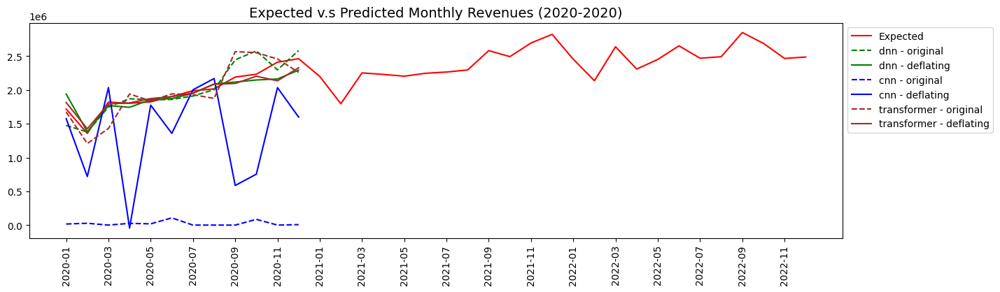

In [ ]:
plotExpectedPredictedRevenues(org_data, pred_dnn, pred_cnn, pred_transformer, start_y)

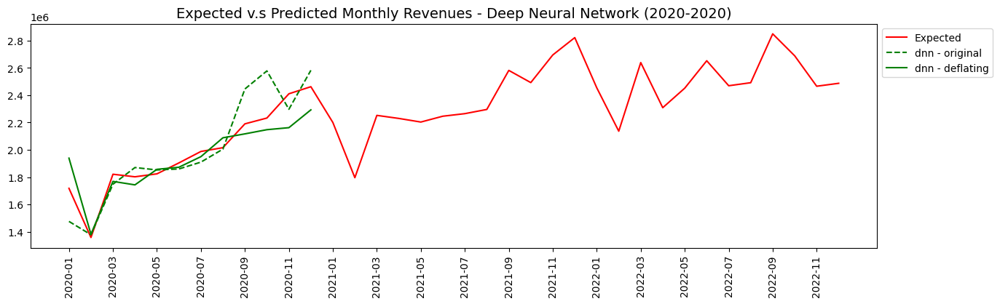

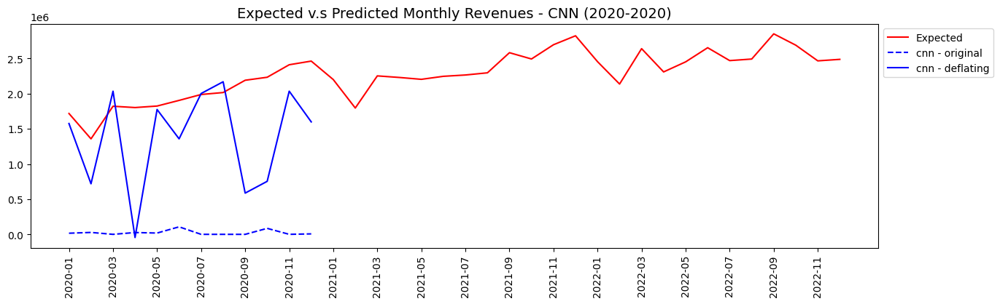

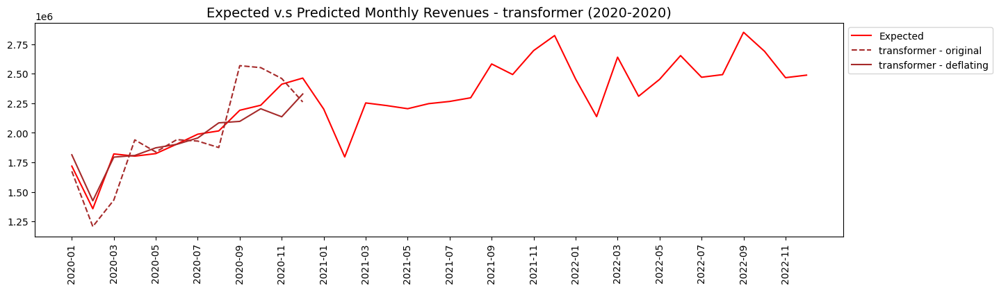

In [ ]:
plotModelExpectedPredictedRevenues(org_data, pred_dnn, 'dnn', start_y)
plotModelExpectedPredictedRevenues(org_data, pred_cnn, 'cnn', start_y)
plotModelExpectedPredictedRevenues(org_data, pred_transformer, 'transformer', start_y)

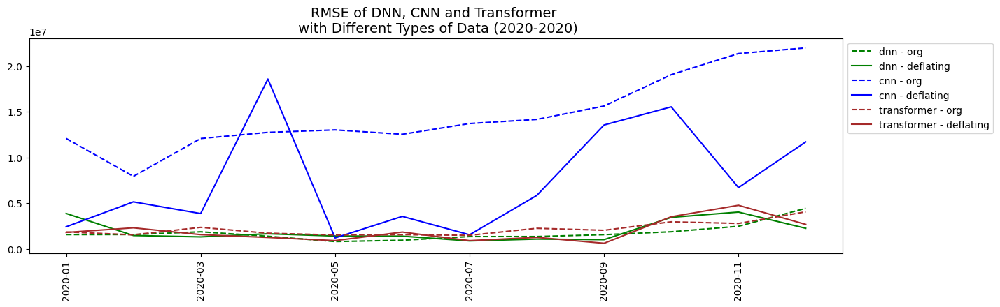

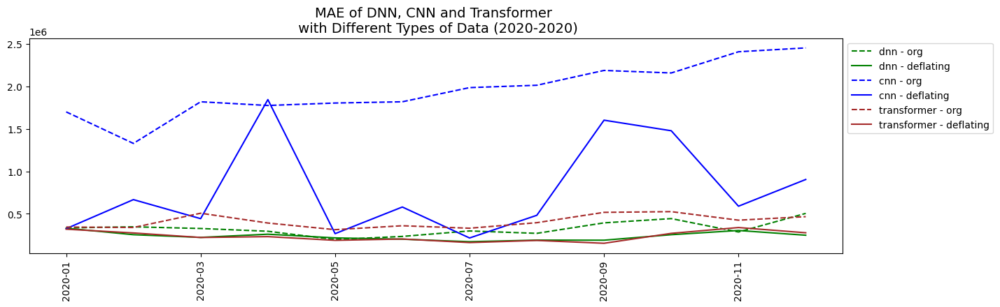

In [ ]:
plotAllScores(scores_dnn, scores_cnn, scores_transformer, start_y)

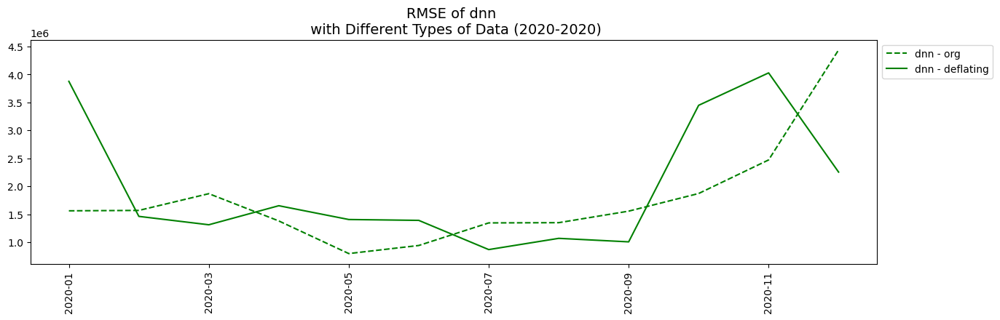

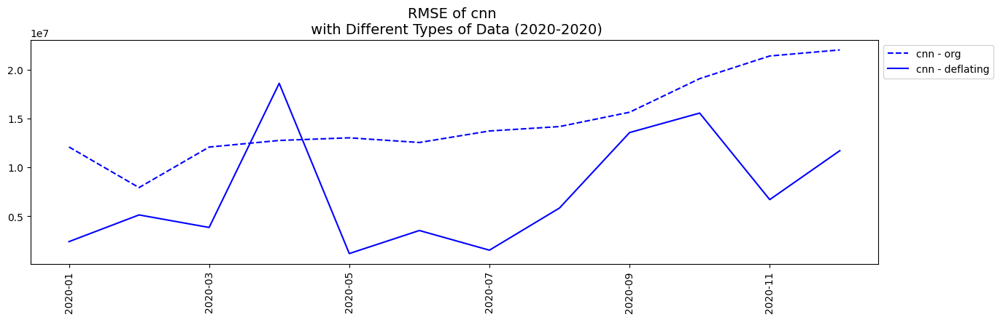

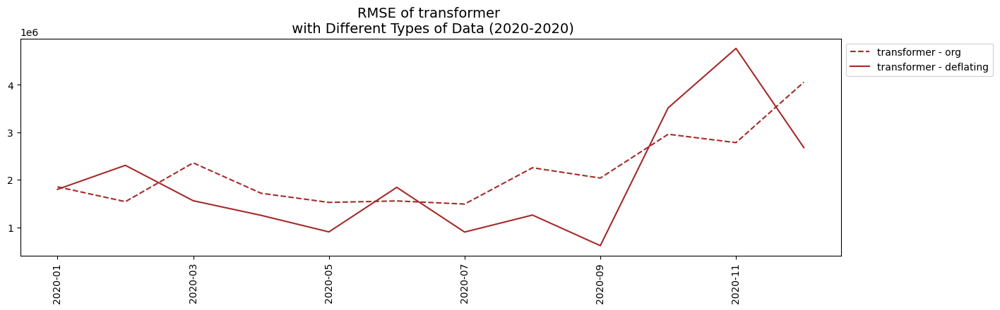

In [ ]:
# RMSE
compareModelScore(scores_dnn, scores_cnn, scores_transformer, 'RMSE', start_y)  

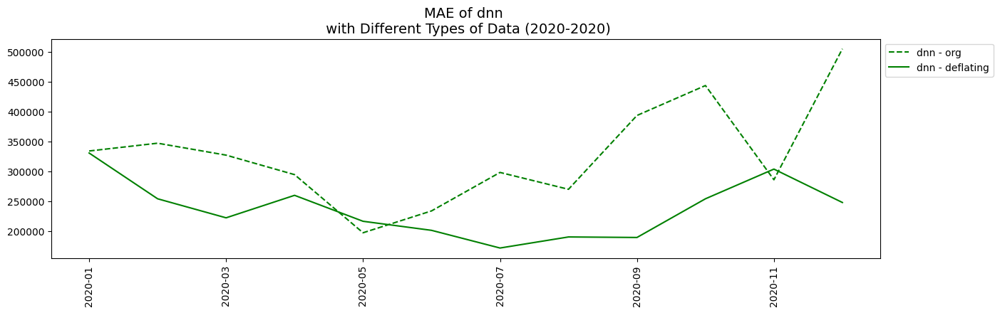

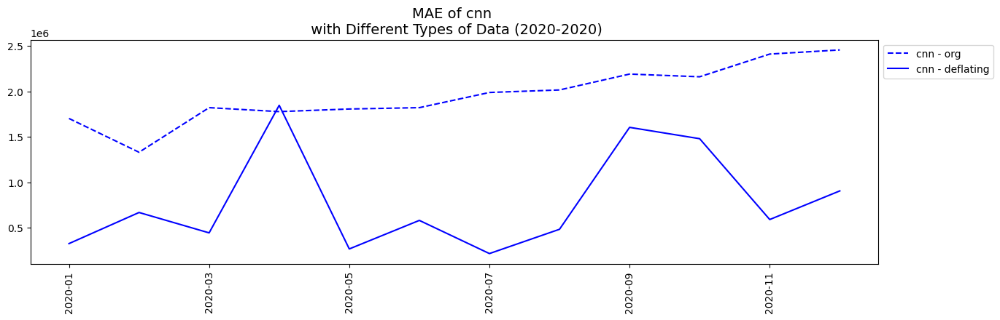

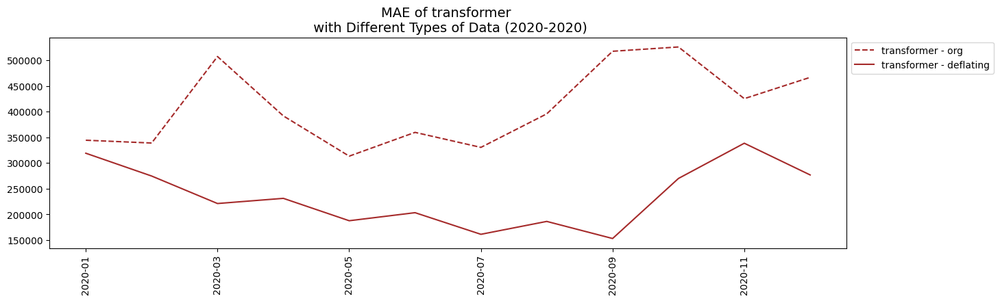

In [ ]:
# MAE
compareModelScore(scores_dnn, scores_cnn, scores_transformer, 'MAE', start_y)  

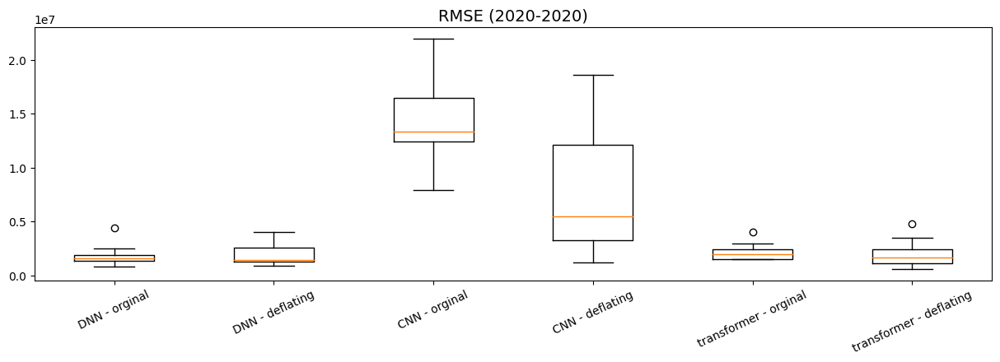

In [ ]:
# RMSE
scoreBoxplotV(scores_dnn, scores_cnn, scores_transformer, 'RMSE', start_y) 

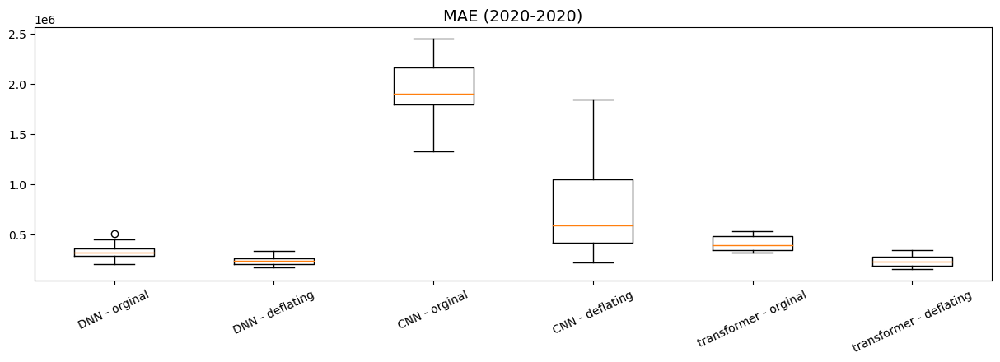

In [ ]:
# MAE
scoreBoxplotV(scores_dnn, scores_cnn, scores_transformer, 'MAE', start_y)  

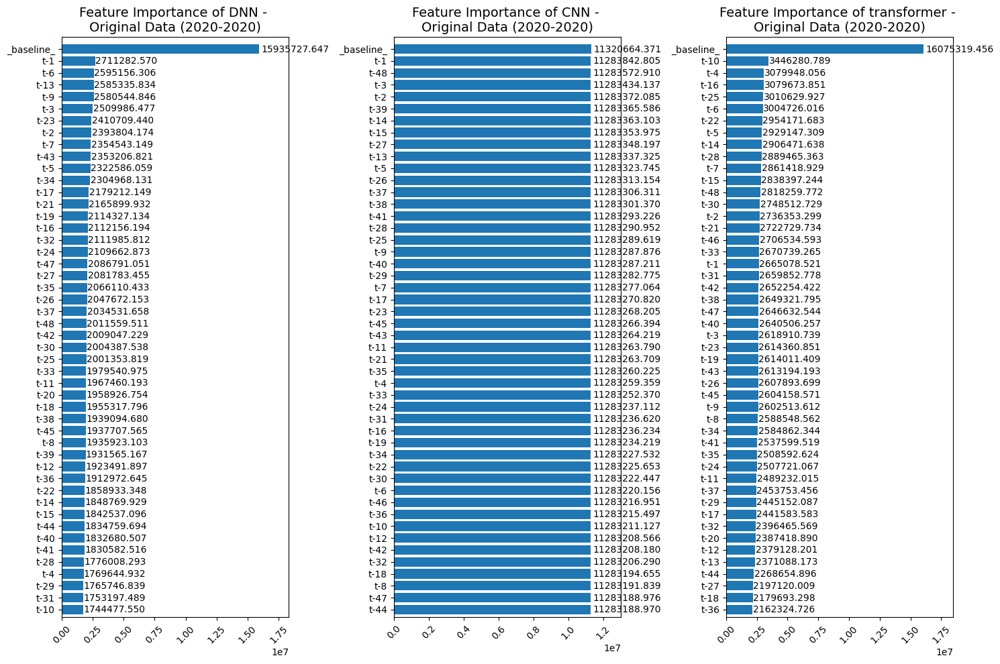

In [ ]:
plotFeatureImportance(
    feature_importance_dnn['org'],
    feature_importance_cnn['org'], 
    feature_importance_transformer['org'], 
    'org', start_y, 48)

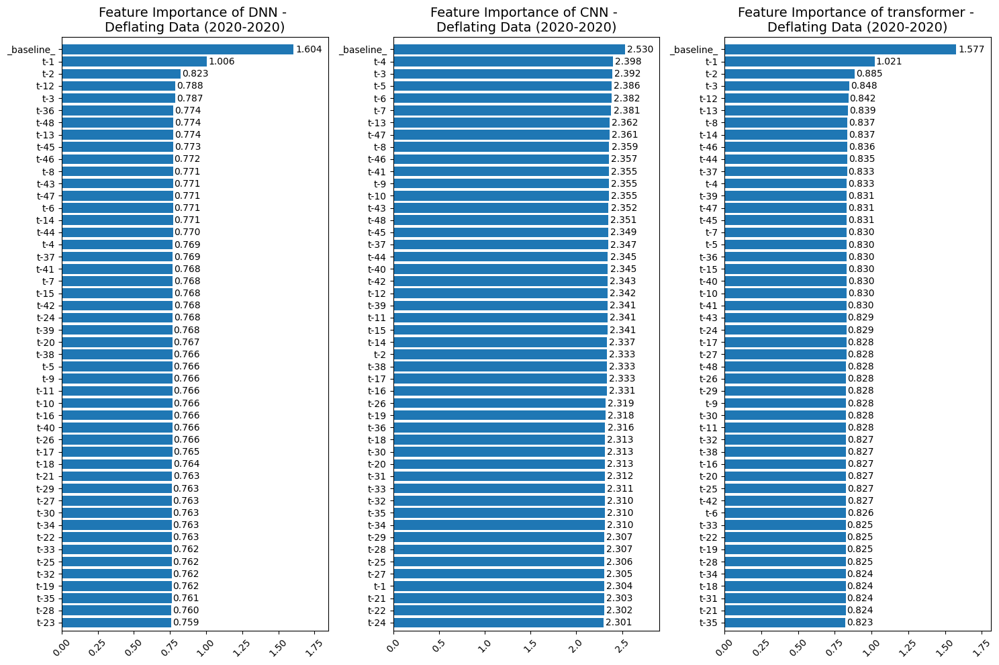

In [ ]:
plotFeatureImportance(
    feature_importance_dnn['def'], 
    feature_importance_cnn['def'], 
    feature_importance_transformer['def'], 
    'def', start_y, 48)

In [305]:
class BestWorstModel():
    '''
    找出最好和最差模型。

    Attributes
    ----------
    best_dnn, worst_dnn: dict
        DNN 在各個衡量指標下最好和最差的模型。
    best_cnn, worst_cnn: dict
        CNN 在各個衡量指標下最好和最差的模型。
    best_transformer, worst_transformer: dict
        transformer 在各個衡量指標下最好和最差的模型。
    best_all, worst_all: dict
        所有模型中，在各個衡量指標下最好和最差的模型。
    ----------
    best_worst_dnn, best_worst_cnn, best_worst_transformer: pd.DataFrame
        各資料處理方式中，預測最好和最差的月份。
    best_worst: pd.DataFrame
        各資料處理方式與模型組合中，預測最好和最差的月份。
    '''

    def __init__(self, score_dnn: pd.DataFrame, score_cnn: pd.DataFrame, score_transformer):
        self.score_dnn = score_dnn
        self.score_cnn = score_cnn
        self.score_transformer = score_transformer
        self.best_worst_dnn, self.best_worst_cnn, self.best_worst_transformer, self.best_worst = self.createBestWorstForAll()
        self.best_dnn, self.worst_dnn = self.findBestWorstByModel('dnn')
        self.best_cnn, self.worst_cnn = self.findBestWorstByModel('cnn')
        self.best_transformer, self.worst_transformer = self.findBestWorstByModel('transformer')
        self.best_all, self.worst_all = self.findBestWorstByModel('all')

    def createBestWorstForAll(self):
        '''
        各資料處理方式與模型組合中，預測最好和最差的月份。
        '''
        best_worst_dnn = pd.DataFrame(columns = ['modelName', 'dataType', 'scoreType', 'min_month', 'min_score', 'max_month', 'max_score'])
        best_worst_cnn = pd.DataFrame(columns = ['modelName', 'dataType', 'scoreType', 'min_month', 'min_score', 'max_month', 'max_score'])
        best_worst_transformer = pd.DataFrame(columns = ['modelName', 'dataType', 'scoreType', 'min_month', 'min_score', 'max_month', 'max_score'])

        # Random Forest
        for colName, colData in self.score_dnn.items():
            best_worst_dnn.loc[len(best_worst_dnn)] = ['dnn', colName.split("-")[-1], colName.split("-")[0], colData.idxmin(), colData.min(), colData.idxmax(), colData.max()]
        # XGB
        for colName, colData in self.score_cnn.items():
            best_worst_cnn.loc[len(best_worst_cnn)] = ['cnn', colName.split("-")[-1], colName.split("-")[0], colData.idxmin(), colData.min(), colData.idxmax(), colData.max()] 
        
        for colName, colData in self.score_transformer.items():
            best_worst_transformer.loc[len(best_worst_transformer)] = ['transformer', colName.split("-")[-1], colName.split("-")[0], colData.idxmin(), colData.min(), colData.idxmax(), colData.max()] 
       
        # All
        best_worst = pd.concat([best_worst_dnn, best_worst_cnn, best_worst_transformer])

        # Sort by scoreType
        best_worst_dnn.sort_values(by=['scoreType'])
        best_worst_cnn.sort_values(by=['scoreType'])
        best_worst_transformer.sort_values(by=['scoreType'])

        return best_worst_dnn, best_worst_cnn, best_worst_transformer, best_worst


    def findBestWorstByModel(self, modelName: str):
        '''
        根據所選擇的模型，找出不同衡量指標下預測最好和最差的月份。

        Parameters
        ----------
        modelName: | 'dnn' | 'cnn' | 'transforner' | 'all' |

        Returns
        ----------
        best_dict: {"RMSE", "MAE"}
        worst_dict: {"RMSE", "MAE"}
        '''

        if modelName == 'dnn':
            scoreD = self.best_worst_dnn.copy()
        elif modelName == 'cnn':
            scoreD = self.best_worst_cnn.copy()
        elif modelName == 'transformer':
            scoreD = self.best_worst_transformer.copy()
        elif modelName == 'all':
            scoreD = self.best_worst.copy()

        best_dict = {}
        worst_dict = {}

        scoreTypes = ['RMSE', 'MAE']
        for s in scoreTypes:
            scores = scoreD[scoreD['scoreType'] == s]   # filter
            best = scores[scores.min_score == scores.min_score.min()]
            best = best.drop(['max_month', 'max_score'], axis=1)
            best_dict[s] = best
            worst = scores[scores.max_score == scores.max_score.max()]
            worst = worst.drop(['min_month', 'min_score'], axis=1)
            worst_dict[s] = worst

        return best_dict, worst_dict


In [306]:
class BestWorstModelFeatureImportancePlot():
    '''
    Parameters
    ----------
    feature_dnn, feature_cnn, feature_transformer: 各模型在各資料處理方式下的變數重要性。
    best_dnn, worst_dnn: DNN 在各個衡量指標下最好和最差的模型。
    best_cnn, worst_cnn: CNN 在各個衡量指標下最好和最差的模型。
    best_transformer, worst_transformer: CNN 在各個衡量指標下最好和最差的模型。
    test_year: 測試資料開始年份。

    Methods
    ----------
    plotBestWorstFeatureImportance(scoreType: str, k: int):
        scoreType: | 'RMSE' | 'MAE' |,
        k: Top k 重要變數 <= 10 (default = 5),
    '''

    def __init__(self, feature_dnn: pd.DataFrame, feature_cnn: pd.DataFrame, 
                 feature_transformer,
                 best_dnn: pd.DataFrame, worst_dnn: pd.DataFrame, 
                 best_cnn: pd.DataFrame, worst_cnn: pd.DataFrame, 
                 best_transformer: pd.DataFrame, worst_transformer: pd.DataFrame, 
                 best_all: pd.DataFrame, worst_all: pd.DataFrame, test_year: int):
        self.feature_dnn = feature_dnn
        self.feature_cnn = feature_cnn
        self.feature_transformer = feature_transformer
        self.best_dnn = best_dnn
        self.worst_dnn = worst_dnn
        self.best_cnn = best_cnn
        self.worst_cnn = worst_cnn
        self.best_transformer = best_transformer
        self.worst_transformer = worst_transformer
        self.best_all = best_all
        self.worst_all = worst_all
        self.test_year = test_year


    def plotSingleFeatureImportance(self, feature_importance: dict, modelName: str, dataType: str, month: str, best_or_worst: str, k: int):
        '''
        畫出 best 或 worst model 的 feature importance。
        '''
        # Data Type          
        if dataType == 'org':
            name = 'Original Data'
            key1 = 'org'
        elif dataType == 'def':
            name = 'Deflating Data'
            key1 = 'def'

        feature = feature_importance[key1][month]     # 最好 or 最差模型的 feature importance              
        feature = feature.sort_values()               # 由小到大做排序
        feature = feature.iloc[-k:, ]                 # Top k

        # Plot
        if self.test_year == 2018:
            plt.title(f"Feature Importance of {modelName} {best_or_worst} Model - \n{name} ({self.test_year}-2018)", size = 14)
        elif self.test_year == 2020:
            plt.title(f"Feature Importance of {modelName} {best_or_worst} Model - \n{name} ({self.test_year}-2020)", size = 14)

        plt.barh(y = feature.index, width = feature.values, data = feature)
        for a, b in zip(range(feature.shape[0]), feature.values):
            plt.text(b*1.01, a-0.1, '%.3f' % b)
        plt.xlim([0, max(feature)*1.15])
        plt.ylim([-0.65, feature.shape[0]])
        plt.xticks(rotation = 45)


    def plotModelBestWorstFeatureImportance(self, modelName: str, dataType: list, month: list, k: int):
        '''
        畫出不同模型最好和最差模型的 Top k 重要變數。

        Parameters
        ----------
        modelName: | 'dnn' | 'cnn' | 'transformer' ,
        dataType: [最佳模型的 data type, 最差模型的 data type],
        month: [最佳模型的月份, 最差模型的月份],
        k: Top k 重要變數 <= 10 (default = 5)
        '''

        # Model
        if modelName == "dnn":
            feature_importance = self.feature_dnn
        elif modelName == "cnn":
            feature_importance = self.feature_cnn
        elif modelName == "transformer":
            feature_importance = self.feature_transformer
        
        # Plot
        plt.figure(figsize=(15,3))
        # Model - Best
        plt.subplot(1,2,1)
        self.plotSingleFeatureImportance(feature_importance, modelName, dataType[0], month[0], "Best", k)
        # Model - Worst
        plt.subplot(1,2,2)
        self.plotSingleFeatureImportance(feature_importance, modelName, dataType[1], month[1], "Worst", k)
        plt.tight_layout()
        plt.show()


    def plotBestWorstFeatureImportance(self, scoreType: str, k: int = 5):
        '''
        畫出不同模型最好和最差模型的 Top k 重要變數。

        Parameters
        ----------
        scoreType: | 'RMSE' | 'MAE' |,
        k: Top k 重要變數 <= 10 (default = 5),
        '''

        if k > 10:
            print("Please select a number smaller than or equal to 10 for top k.") 
        else:
            dataName_dnn = [self.best_dnn[scoreType].iloc[0]['dataType'], self.worst_dnn[scoreType].iloc[0]['dataType']]
            dataName_cnn = [self.best_cnn[scoreType].iloc[0]['dataType'], self.worst_cnn[scoreType].iloc[0]['dataType']]
            dataName_transformer = [self.best_transformer[scoreType].iloc[0]['dataType'], self.worst_transformer[scoreType].iloc[0]['dataType']]
            month_dnn = [self.best_dnn[scoreType].iloc[0]['min_month'], self.worst_dnn[scoreType].iloc[0]['max_month']]
            month_cnn = [self.best_cnn[scoreType].iloc[0]['min_month'], self.worst_cnn[scoreType].iloc[0]['max_month']]           
            month_transformer = [self.best_transformer[scoreType].iloc[0]['min_month'], self.worst_transformer[scoreType].iloc[0]['max_month']]           
            # Random Forest
            self.plotModelBestWorstFeatureImportance('dnn', dataName_dnn, month_dnn, k)
            # XGB
            self.plotModelBestWorstFeatureImportance('cnn', dataName_cnn, month_cnn, k)
            self.plotModelBestWorstFeatureImportance('transformer', dataName_transformer, month_transformer, k)


In [ ]:
bw = BestWorstModel(scores_dnn, scores_cnn, scores_transformer)

In [ ]:
imp_plot = BestWorstModelFeatureImportancePlot(
    feature_importance_dnn, feature_importance_cnn, feature_importance_transformer, 
    bw.best_dnn, bw.worst_dnn, 
    bw.best_cnn, bw.worst_cnn, 
    bw.best_transformer, bw.worst_transformer, 
    bw.best_all, bw.worst_all, start_y)
top_k = 5

In [ ]:
# Random Forest
bw.best_dnn['RMSE']

,modelName,dataType,scoreType,min_month,min_score
0,dnn,org,RMSE,2020-05,798648.0


In [ ]:
# XGB
bw.best_cnn['RMSE']

,modelName,dataType,scoreType,min_month,min_score
2,cnn,def,RMSE,2020-05,1197665.0


In [ ]:
bw.best_transformer['RMSE']

,modelName,dataType,scoreType,min_month,min_score
2,transformer,def,RMSE,2020-09,612397.0


In [ ]:
# Random Forest
bw.worst_dnn['RMSE']

,modelName,dataType,scoreType,max_month,max_score
0,dnn,org,RMSE,2020-12,4437544.0


In [ ]:
# XGB
bw.worst_cnn['RMSE']

,modelName,dataType,scoreType,max_month,max_score
0,cnn,org,RMSE,2020-12,21997652.0


In [ ]:
# XGB
bw.worst_transformer['RMSE']

,modelName,dataType,scoreType,max_month,max_score
2,transformer,def,RMSE,2020-11,4769291.0


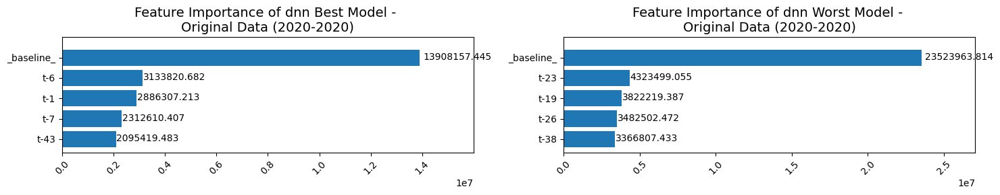

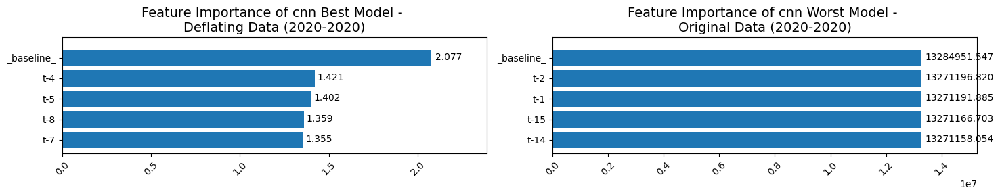

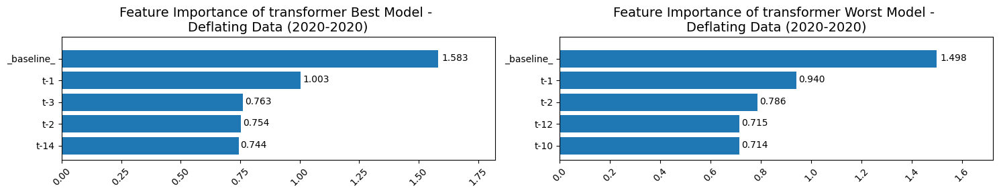

In [ ]:
imp_plot.plotBestWorstFeatureImportance('RMSE', top_k)

In [ ]:
# Random Forest
bw.best_dnn['MAE']

,modelName,dataType,scoreType,min_month,min_score
3,dnn,def,MAE,2020-07,171680.0


In [ ]:
# XGB
bw.best_cnn['MAE']

,modelName,dataType,scoreType,min_month,min_score
3,cnn,def,MAE,2020-07,215465.0


In [ ]:
bw.best_transformer['MAE']

,modelName,dataType,scoreType,min_month,min_score
3,transformer,def,MAE,2020-09,153132.0


In [ ]:
# Random Forest
bw.worst_dnn['MAE']

,modelName,dataType,scoreType,max_month,max_score
1,dnn,org,MAE,2020-12,505223.0


In [ ]:
# XGB
bw.worst_cnn['MAE']

,modelName,dataType,scoreType,max_month,max_score
1,cnn,org,MAE,2020-12,2455357.0


In [ ]:
bw.worst_transformer['MAE']

,modelName,dataType,scoreType,max_month,max_score
1,transformer,org,MAE,2020-10,525805.0


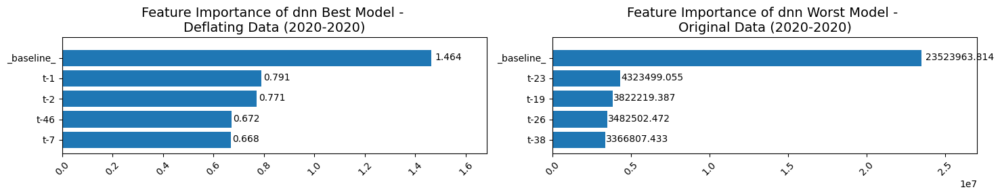

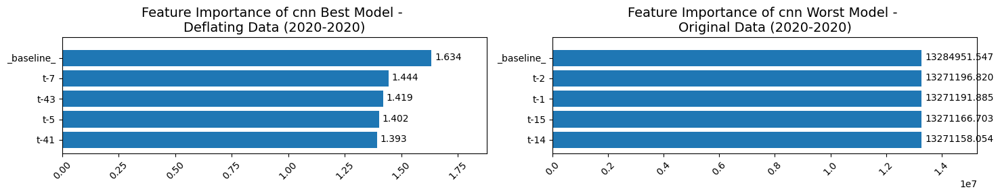

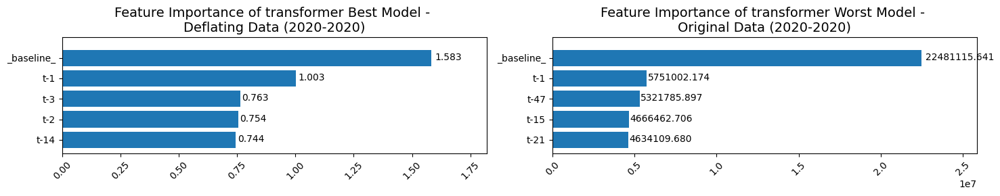

In [ ]:
imp_plot.plotBestWorstFeatureImportance('MAE', top_k)

In [ ]:
!cp -r logs/ /content/gdrive/MyDrive/logs

## 第二部分：鎖定產業進行預測
自行挑選一個產業，討論其月營收預測的結果。產業範圍可以自行決定，預測時間同第一部分，為 2020/1 ~ 2022/12
- 請嘗試用程式碼進行產業篩選，不接受自行建立 excel 檔
- 決定資料是否平減也是你實驗設計的一環

In [307]:
industry = pd.read_excel(os.path.join(project_path, 'TSE industry.xlsx'))
display(industry)

,公司簡稱,TSE 產業別,TSE新產業_名稱
0,1101 台泥,1,水泥工業
1,1102 亞泥,1,水泥工業
2,1103 嘉泥,1,水泥工業
3,1104 環泥,1,水泥工業
4,1108 幸福,1,水泥工業
...,...,...,...
1783,9949 琉園,32,文化創意業
1784,9950 萬國通,3,塑膠工業
1785,9951 皇田,5,電機機械
1786,9960 邁達康,18,貿易百貨


In [308]:
# 分析半導體業
company_list = industry[(industry['TSE新產業_名稱'] == '半導體')]['公司簡稱'].tolist()
company_filter = org_data.index.isin(company_list)
org_data1 = org_data.loc[company_filter,:]
display(org_data1)

,2013-01,2013-02,2013-03,2013-04,2013-05,2013-06,2013-07,2013-08,2013-09,2013-10,...,2022-03,2022-04,2022-05,2022-06,2022-07,2022-08,2022-09,2022-10,2022-11,2022-12
公司,,,,,,,,,,,,,,,,,,,,,
2302 麗正,32323,38937,63530,56392,63172,53532,52372,49822,55125,49190,...,68638,73724,65387,74530,81749,81810,80543,85579,83652,54578
2303 聯電,9452116,8730655,9598645,10280727,10863111,10760866,11557852,10998405,10850515,10467850,...,22140452,22796461,24433030,24825649,24826685,25346076,25218828,24344264,22545442,20946009
2329 華泰,811872,650908,791498,827292,752354,666011,855143,816559,818219,800820,...,1496740,1462314,1413069,1412836,1313341,1327389,1168206,1195847,1239696,1172398
2330 台積電,47438687,41182084,44134225,50070645,51787926,54027749,52103384,55091177,55382473,51794813,...,171966525,172561382,185705425,175874001,186762689,218132391,208247663,210265633,222705993,192560242
2337 旺宏,1634437,1315314,1455039,1811814,1639042,1779787,1805327,2525116,2377816,2286434,...,4256653,3879228,3548418,3912403,3604068,3727862,4139594,3730395,2765340,2582192
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8227 巨有科技,13732,10712,78725,15388,24419,17002,23119,21068,18879,18266,...,65200,177363,58257,69207,60818,45411,126400,123437,76888,42847
8261 富鼎,190469,123948,172033,162011,167754,156559,181700,185291,158851,174936,...,404370,327677,437243,398320,333983,287845,288271,253439,239214,213534
8271 宇瞻,804778,508477,796285,852122,797902,789587,973546,783425,988308,906131,...,759685,729186,637906,745768,674479,698115,872632,821615,704886,608988


In [309]:
print("Data shape:", org_data1.shape)
print("Data size:", org_data1.size)

Data shape: (129, 120)
Data size: 15480


In [310]:
start_y = 2020
start_m = 1
end_y = 2020
end_m = 12

In [ ]:
# 訓練與預測 (12 min.)
pred_dnn1, feature_importance_dnn1, scores_dnn1 = predictMonthlyRevenue(
    org_data1, start_y, start_m, end_y, end_m, 'dnn', make_dnn_model, 1e-4
)

In [312]:
# 原始資料的預測金額
pred_dnn1['org'].head(4)

,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11,2020-12
2302 麗正,39142.0,44588.0,37418.0,38570.0,44889.0,46466.0,47981.0,45645.0,53587.0,57498.0,58055.0,67673.0
2303 聯電,12281950.0,12962206.0,10610764.0,13536074.0,12680625.0,14229355.0,13367267.0,15783001.0,16829940.0,17081324.0,17659470.0,15633718.0
2329 華泰,1292800.0,1399826.0,1323881.0,1363139.0,1159228.0,1496415.0,1267300.0,1558542.0,1432388.0,1649102.0,1810900.0,1495704.0
2330 台積電,74123784.0,88784528.0,64161824.0,96801184.0,71070160.0,92464512.0,95479448.0,123365968.0,111695312.0,117799344.0,119416208.0,118423088.0


In [313]:
# 平減資料的預測金額
pred_dnn1['def'].head(4)

,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11,2020-12
2302 麗正,40380.0,30167.0,38869.0,43037.0,46060.0,40488.0,42914.0,52431.0,56190.0,57561.0,78466.0,101615.0
2303 聯電,11909211.0,11976817.0,12465761.0,13139390.0,14045459.0,14268967.0,14642843.0,15758017.0,13437944.0,14347398.0,14184205.0,13558177.0
2329 華泰,1334345.0,1211185.0,1226377.0,1307882.0,1344547.0,1183861.0,1243401.0,1245816.0,980256.0,1143895.0,1185178.0,1122954.0
2330 台積電,94763072.0,84658800.0,99918408.0,100785192.0,108188216.0,104529208.0,117166416.0,121291600.0,110617072.0,118375584.0,113572456.0,123551424.0


In [314]:
# 預測分數
scores_dnn1.head(4)

,RMSE-org,MAE-org,RMSE-def,MAE-def
2020-01,2617308.0,350950.0,821129.0,152916.0
2020-02,558556.0,160846.0,817541.0,193734.0
2020-03,4394566.0,653953.0,1240124.0,226616.0
2020-04,286379.0,122427.0,506119.0,143641.0


In [ ]:
pred_cnn1, feature_importance_cnn1, scores_cnn1 = predictMonthlyRevenue(
    org_data1, start_y, start_m, end_y, end_m, 'cnn', make_cnn_model, 5e-2
)

In [349]:
# 原始資料的預測金額
pred_cnn1['org'].head(4)

,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11,2020-12
2302 麗正,38.0,24.0,14.0,30.0,14.0,28.0,15.0,23.0,20.0,69.0,11.0,33.0
2303 聯電,6526.0,4926.0,4579.0,4375.0,3587.0,4598.0,3813.0,4724.0,5023.0,4018.0,4231.0,4551.0
2329 華泰,698.0,545.0,492.0,481.0,384.0,505.0,395.0,482.0,494.0,429.0,414.0,457.0
2330 台積電,43910.0,33211.0,31035.0,29814.0,24664.0,31460.0,26514.0,32665.0,35078.0,27880.0,29650.0,31962.0


In [350]:
# 平減資料的預測金額
pred_cnn1['def'].head(4)

,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11,2020-12
2302 麗正,32490.0,13282.0,58521.0,41541.0,42216.0,41371.0,39388.0,43031.0,55489.0,66346.0,92901.0,66543.0
2303 聯電,11479385.0,12141749.0,15066036.0,14104762.0,12824621.0,12707418.0,13226461.0,13006189.0,13552612.0,15094024.0,13999504.0,14756006.0
2329 華泰,1240777.0,1154201.0,1711700.0,1341466.0,1313365.0,1251301.0,1396396.0,1290969.0,1265508.0,1492774.0,1166677.0,1495720.0
2330 台積電,75869232.0,77423720.0,118822504.0,110503576.0,89923360.0,86672912.0,96292048.0,90996928.0,103685904.0,125091056.0,123397304.0,113893184.0


In [351]:
# 預測分數
scores_cnn1.head(4)

,RMSE-org,MAE-org,RMSE-def,MAE-def
2020-01,9464569.0,1705815.0,2473315.0,349448.0
2020-02,8562165.0,1612182.0,1572579.0,390734.0
2020-03,10383907.0,1922354.0,770502.0,275485.0
2020-04,8861904.0,1733769.0,1324801.0,238605.0


In [319]:
pred_transformer1, feature_importance_transformer1, scores_transformer1 = predictMonthlyRevenue(
    org_data1, start_y, start_m, end_y, end_m, 'transformer', make_transformer_model, 1e-4
)

  0%|          | 0/12 [00:00<?, ?it/s]

串流輸出內容已截斷至最後 5000 行。
5/5 [==============================] - 0s 3ms/step
Using time: 4187.102  secs.


In [320]:
# 原始資料的預測金額
pred_transformer1['org'].head(4)

,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11,2020-12
2302 麗正,40356.0,36398.0,44322.0,40169.0,40144.0,34019.0,50513.0,56386.0,46344.0,62251.0,64368.0,82377.0
2303 聯電,13991796.0,10180472.0,13795042.0,13707854.0,14382613.0,10077394.0,16084860.0,16861622.0,14014633.0,17371080.0,14761923.0,17839732.0
2329 華泰,1217611.0,1164867.0,1439155.0,1176622.0,1449296.0,1256537.0,1572196.0,1345966.0,1203530.0,1527976.0,1436464.0,1493810.0
2330 台積電,95877088.0,79306104.0,87423160.0,95616104.0,91689280.0,51666744.0,94351240.0,123095048.0,117503088.0,119173488.0,125272616.0,114874744.0


In [321]:
# 平減資料的預測金額
pred_transformer1['def'].head(4)

,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11,2020-12
2302 麗正,37149.0,34240.0,35504.0,39366.0,40098.0,46655.0,49870.0,47487.0,54976.0,51094.0,65979.0,91790.0
2303 聯電,12758331.0,11692465.0,12960962.0,13833568.0,14908710.0,14806507.0,15981304.0,15076410.0,15216454.0,14889872.0,14430731.0,14927466.0
2329 華泰,1301446.0,1107578.0,1311123.0,1288740.0,1212818.0,1366899.0,1269208.0,1129400.0,1075347.0,1360716.0,1179004.0,1218251.0
2330 台積電,93062704.0,74996424.0,102113880.0,110626672.0,107984760.0,115030352.0,110603592.0,125750320.0,122727232.0,108821008.0,118266064.0,118398552.0


In [322]:
# 預測分數
scores_transformer1.head(4)

,RMSE-org,MAE-org,RMSE-def,MAE-def
2020-01,768480.0,212354.0,962655.0,171519.0
2020-02,1371407.0,333569.0,1647669.0,270852.0
2020-03,2320939.0,357896.0,1038842.0,200260.0
2020-04,368708.0,147187.0,1304252.0,197740.0


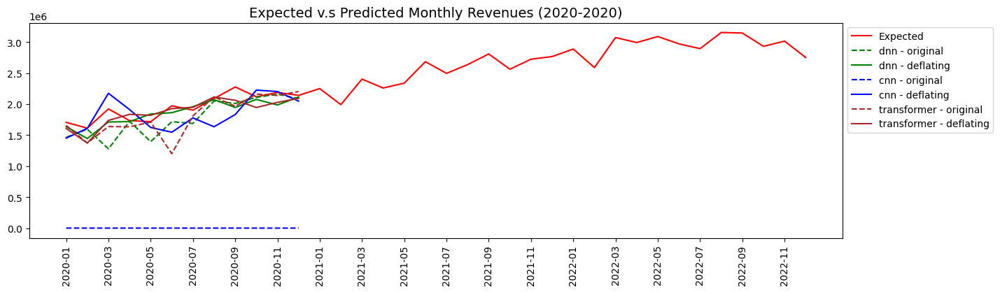

In [323]:
plotExpectedPredictedRevenues(org_data1, pred_dnn1, pred_cnn1, pred_transformer1, start_y)

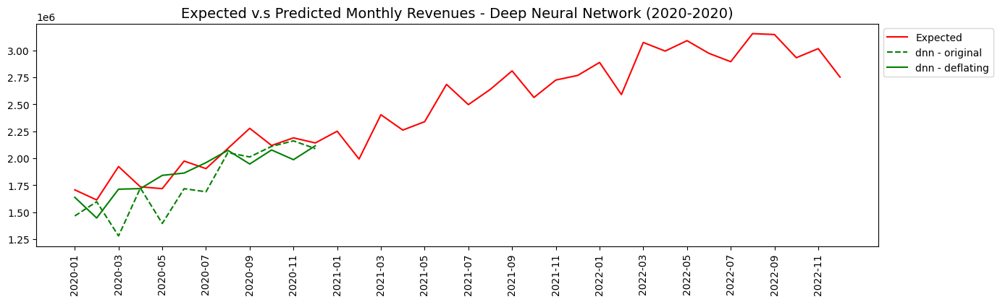

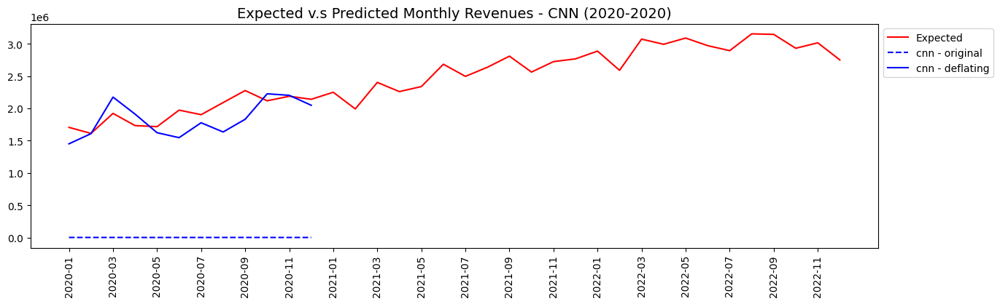

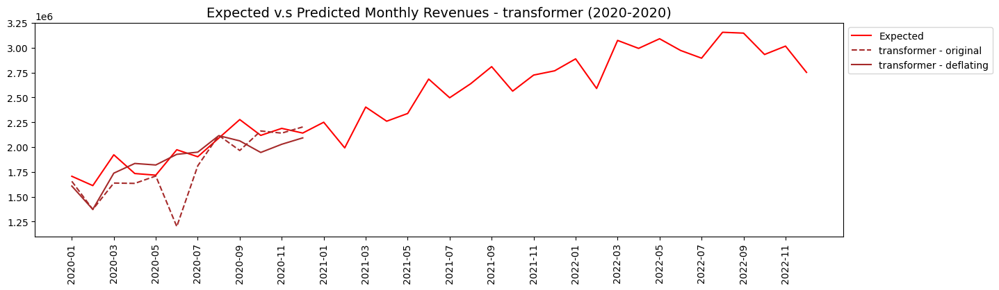

In [324]:
plotModelExpectedPredictedRevenues(org_data1, pred_dnn1, 'dnn', start_y)
plotModelExpectedPredictedRevenues(org_data1, pred_cnn1, 'cnn', start_y)
plotModelExpectedPredictedRevenues(org_data1, pred_transformer1, 'transformer', start_y)

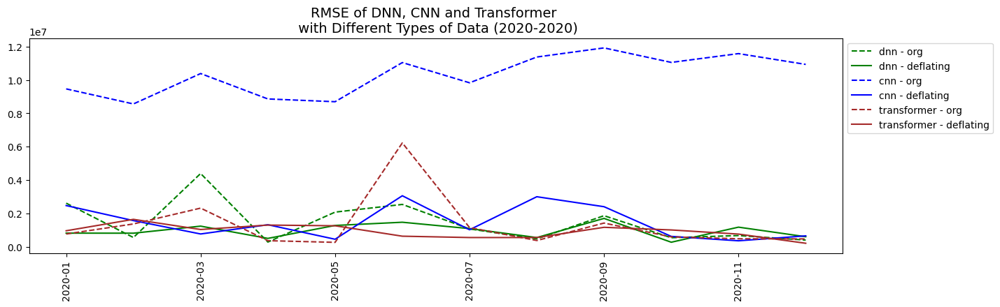

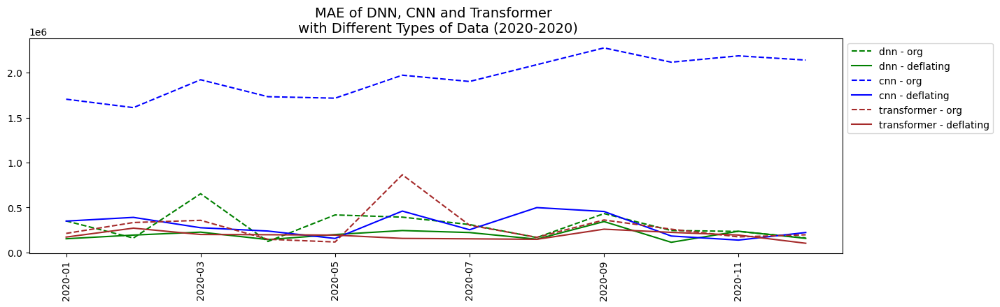

In [325]:
plotAllScores(scores_dnn1, scores_cnn1, scores_transformer1, start_y)

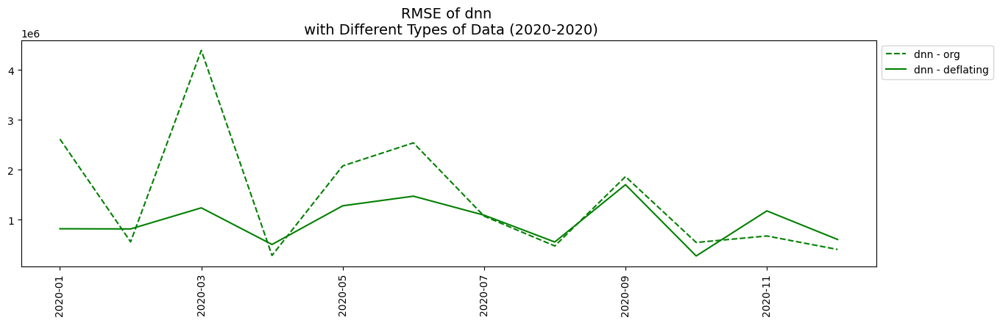

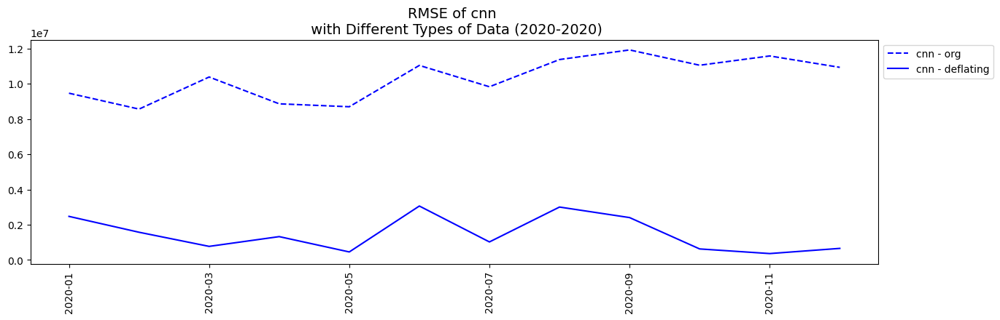

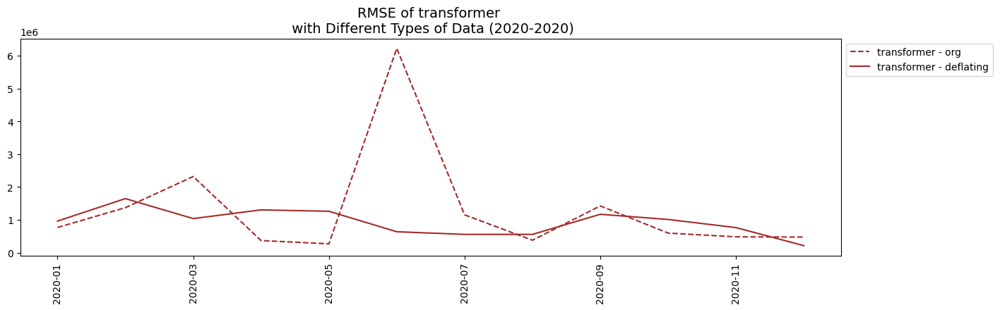

In [326]:
# RMSE
compareModelScore(scores_dnn1, scores_cnn1, scores_transformer1, 'RMSE', start_y) 

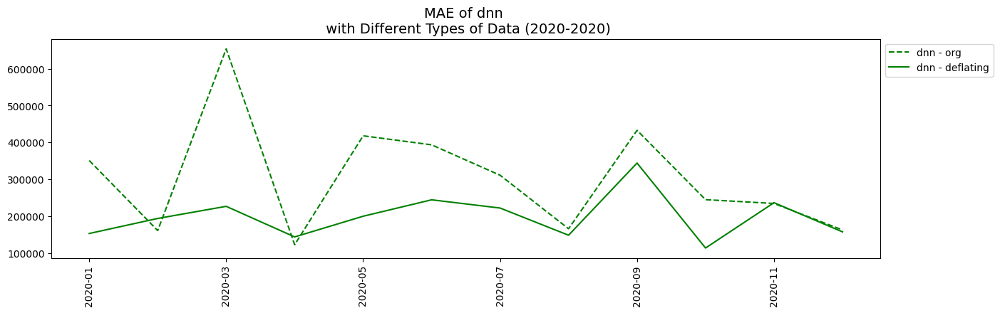

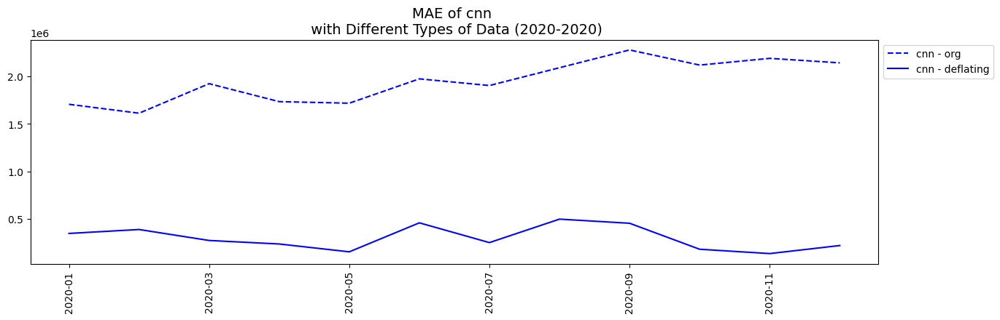

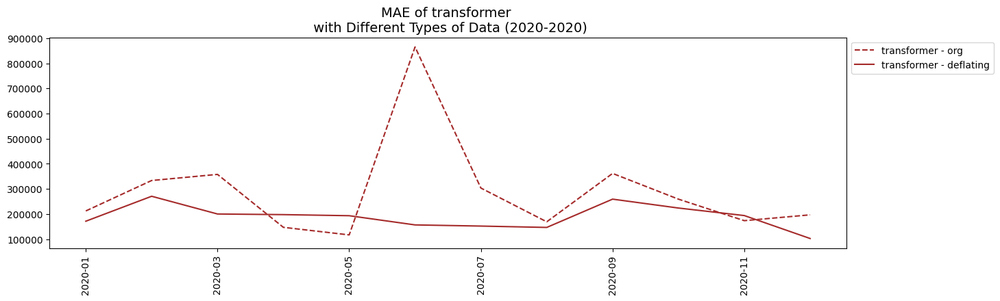

In [327]:
# MAE
compareModelScore(scores_dnn1, scores_cnn1, scores_transformer1, 'MAE', start_y)  

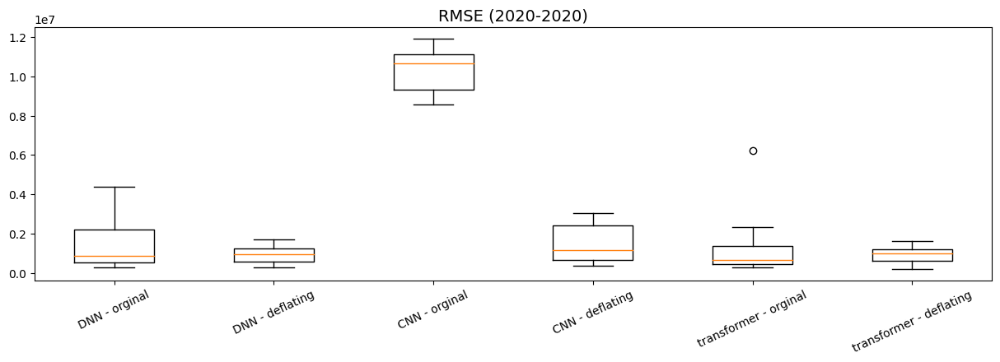

In [328]:
# RMSE
scoreBoxplotV(scores_dnn1, scores_cnn1, scores_transformer1, 'RMSE', start_y) 

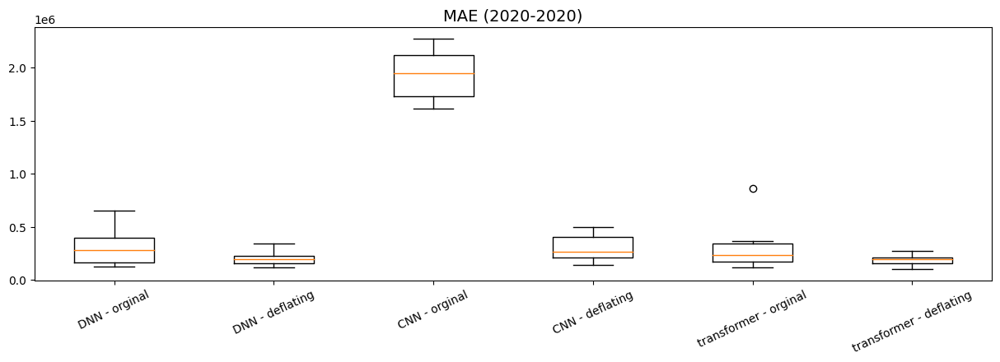

In [329]:
# MAE
scoreBoxplotV(scores_dnn1, scores_cnn1, scores_transformer1, 'MAE', start_y)  

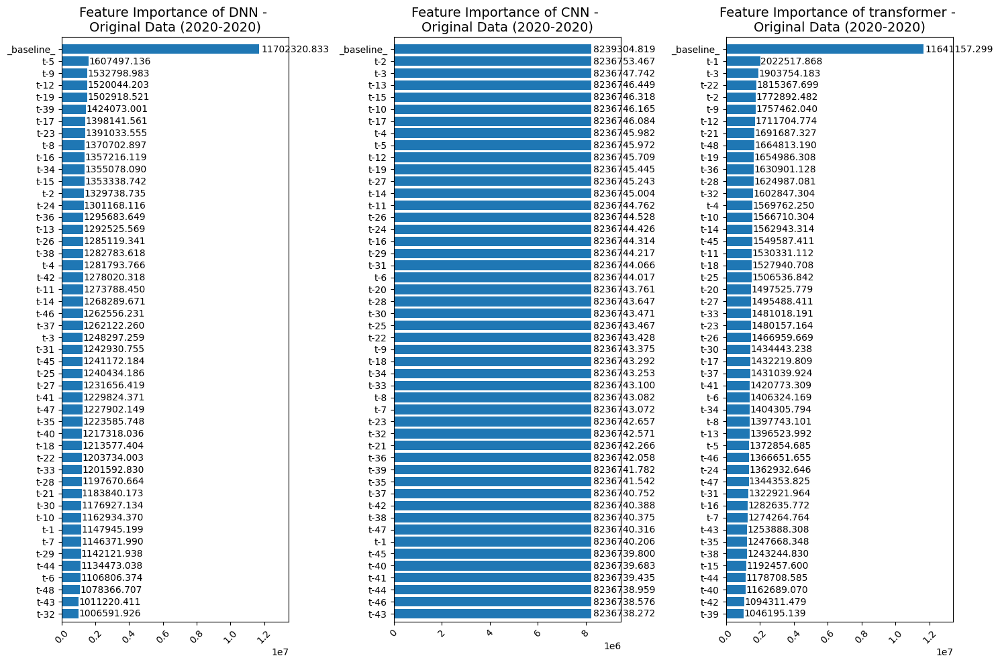

In [330]:
plotFeatureImportance(
    feature_importance_dnn1['org'],
    feature_importance_cnn1['org'], 
    feature_importance_transformer1['org'], 
    'org', start_y, 48)

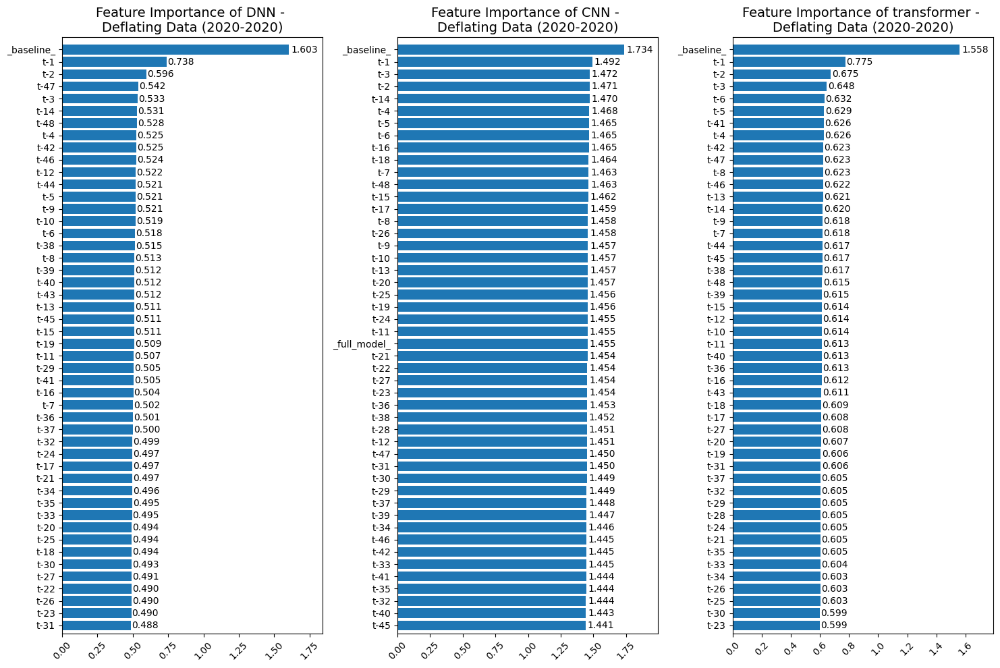

In [331]:
plotFeatureImportance(
    feature_importance_dnn1['def'], 
    feature_importance_cnn1['def'], 
    feature_importance_transformer1['def'], 
    'def', start_y, 48)

In [332]:
bw1 = BestWorstModel(scores_dnn1, scores_cnn1, scores_transformer1)

In [333]:
imp_plot1 = BestWorstModelFeatureImportancePlot(
    feature_importance_dnn1, feature_importance_cnn1, feature_importance_transformer1, 
    bw1.best_dnn, bw1.worst_dnn, 
    bw1.best_cnn, bw1.worst_cnn, 
    bw1.best_transformer, bw1.worst_transformer, 
    bw1.best_all, bw1.worst_all, start_y)
top_k = 5

In [334]:
# Random Forest
bw1.best_dnn['RMSE']

,modelName,dataType,scoreType,min_month,min_score
2,dnn,def,RMSE,2020-10,276382.0


In [335]:
# XGB
bw1.best_cnn['RMSE']

,modelName,dataType,scoreType,min_month,min_score
2,cnn,def,RMSE,2020-11,362770.0


In [336]:
bw1.best_transformer['RMSE']

,modelName,dataType,scoreType,min_month,min_score
2,transformer,def,RMSE,2020-12,214026.0


In [337]:
# Random Forest
bw1.worst_dnn['RMSE']

,modelName,dataType,scoreType,max_month,max_score
0,dnn,org,RMSE,2020-03,4394566.0


In [338]:
# XGB
bw1.worst_cnn['RMSE']

,modelName,dataType,scoreType,max_month,max_score
0,cnn,org,RMSE,2020-09,11920320.0


In [339]:
# XGB
bw1.worst_transformer['RMSE']

,modelName,dataType,scoreType,max_month,max_score
0,transformer,org,RMSE,2020-06,6227060.0


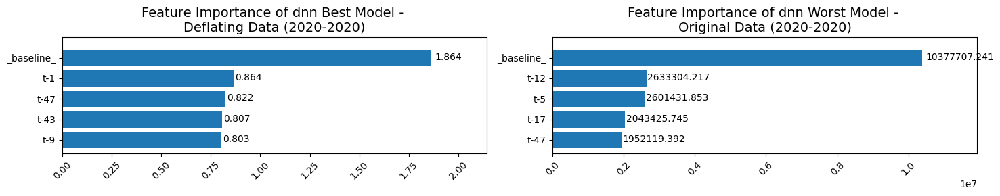

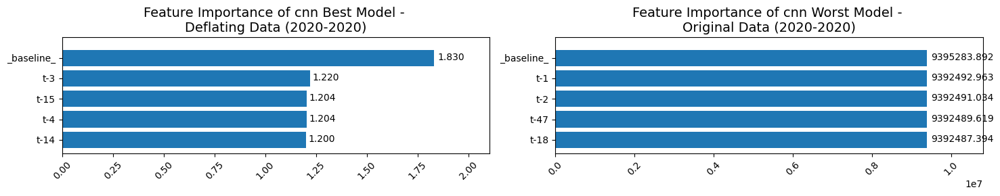

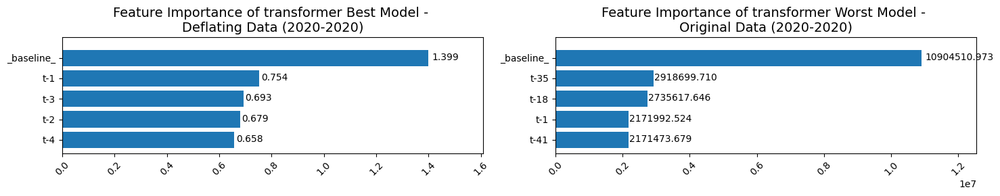

In [340]:
imp_plot1.plotBestWorstFeatureImportance('RMSE', top_k)

In [341]:
# Random Forest
bw1.best_dnn['MAE']

,modelName,dataType,scoreType,min_month,min_score
3,dnn,def,MAE,2020-10,113521.0


In [342]:
# XGB
bw1.best_cnn['MAE']

,modelName,dataType,scoreType,min_month,min_score
3,cnn,def,MAE,2020-11,137921.0


In [343]:
bw1.best_transformer['MAE']

,modelName,dataType,scoreType,min_month,min_score
3,transformer,def,MAE,2020-12,102666.0


In [344]:
# Random Forest
bw1.worst_dnn['MAE']

,modelName,dataType,scoreType,max_month,max_score
1,dnn,org,MAE,2020-03,653953.0


In [345]:
# XGB
bw1.worst_cnn['MAE']

,modelName,dataType,scoreType,max_month,max_score
1,cnn,org,MAE,2020-09,2276707.0


In [346]:
bw1.worst_transformer['MAE']

,modelName,dataType,scoreType,max_month,max_score
1,transformer,org,MAE,2020-06,865152.0


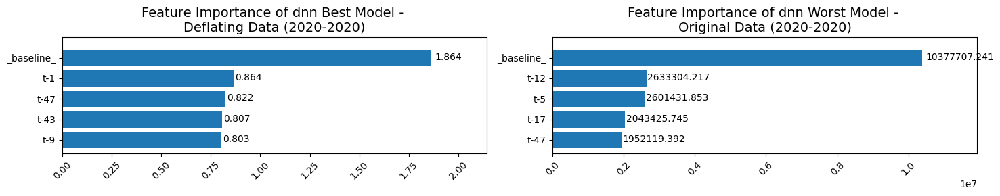

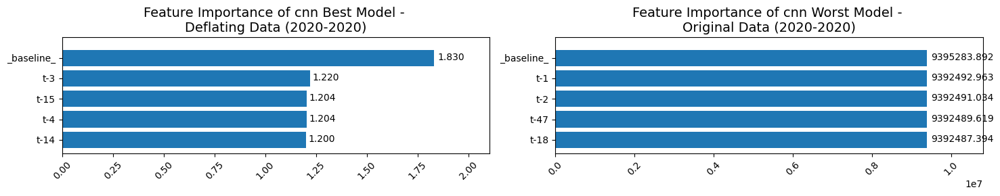

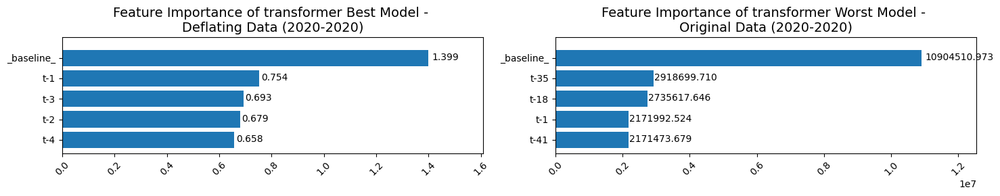

In [347]:
imp_plot1.plotBestWorstFeatureImportance('MAE', top_k)

In [348]:
!cp -r logs/ /content/gdrive/MyDrive/logs